# Machine Learning Project: ML_Real estate price predictions

## Predict Real Estate Prices using an API requested to Idealista

By extracting data using the Idealista API, it will be possible to perform monthly searches and develop a model that allows for calculating updated property prices. The main objective is to analyze whether sales prices represent a favorable purchasing opportunity in **Asturias**. This will allow potential buyers to make more informed decisions in the real estate market.

Search API lets you integrate property information published on idealista into your site or app.

**https://developers.idealista.com/access-request**


### 0. Extracting data using the Idealista API, defining the functions, parameters, URL, and first visualization of the dataset

In [1]:
# Importing
import base64
import requests as rq
import json
import pandas as pd


In [7]:
# Defining the function to get token
def get_token():    
    '''
    The function will return the customized token
    '''
    api_key = 'ucdqwx5t02bfrynufi0r7psnwb6fu11c'          # API key provided by Idealista
    secret = 'ZwjDHTCE9yWM'                               # Secret code provided by Idealista
    message = api_key + ":" + secret                      # Concatenating the encoded API key and the secret
    auth = "Basic " + base64.b64encode(message.encode("ascii")).decode("ascii")   # Encoding the message
    headers_1 = {"Authorization" : auth,
                   "Content-Type" : "application/x-www-form-urlencoded;charset=UTF-8"}   # Defining the headers
    data_1 = {"grant_type" : "client_credentials",      # Defining the request parameters
                  "scope" : "read"}
    r = rq.post("https://api.idealista.com/oauth/token",  # Requesting the API URL, headers and params
                      headers = headers_1,
                      data = data_1)
    token = json.loads(r.text)['access_token']            # Obtaining the custom token, in JSON format
    return token


In [8]:
# These are the parameters that will be used to filter the search.
base_url = 'https://api.idealista.com/3.5/'     # Resource URL
country = 'es'                                  # Countries (values: es (Spain), it (Italy), and pt(Portugal))                          
language = 'es'                                 # Language (values: es, it, pt, en, ca) 
max_items = '50'                                # 50 a maximum allowed per call set by Idealista
operation = 'sale'                              # Operation type (values: sale, rent) 
property_type = 'homes'                         # Type of property (values: homes, offices, premises, garages, bedrooms)
order = 'priceDown'                             # Allowed values by property_type: homes
center = '43.53573,-5.66152'                    # Geographic coordinates -> ASTURIAS (Gijon Center)
distance = '250000'                             # Maximum distance from the center (Gijon Center)
sort = 'desc'                                   # Sorting the found items
bankOffer = 'false'                             # If the owner is a bank
maxprice = '1000000'                            # Maximum price

In [9]:
# Defining the function to obtain the search URL for Sales in Gijon, Asturias

def define_url(operation = 'sale', country = 'es',language = 'es',max_items = '50',property_type = 'homes',order = 'priceDown',
                      center = '43.53573,-5.66152',distance = '250000',sort = 'desc',bankOffer = 'false',maxprice = '1000000'):
    '''
    These are the parameters that will be used to filter the search. So, the function will combine these parameters with the url to generate our 
    own search url parameters: 

    base_url = 'https://api.idealista.com/3.5/'     # Resource URL
    country = 'es'                                  # Countries (values: es (Spain), it (Italy), and pt(Portugal))                          
    language = 'es'                                 # Language (values: es, it, pt, en, ca) 
    max_items = '50'                                # 50 a maximum allowed per call set by Idealista
    operation = 'sale'                              # Operation type (values: sale, rent) 
    property_type = 'homes'                         # Type of property (values: homes, offices, premises, garages, bedrooms)
    order = 'priceDown'                             # Allowed values by property_type: homes
    center = '43.53573,-5.66152'                    # Geographic coordinates -> ASTURIAS (Gijon Center)
    distance = '250000'                             # Maximum distance from the center (Gijon Center)
    sort = 'desc'                                   # Sorting the found items
    bankOffer = 'false'                             # If the owner is a bank
    maxprice = '1000000'                            # Maximum price

    '''
    url = ('https://api.idealista.com/3.5/'  +      
           country +
           '/search?operation=' + operation +
           '&maxItems=' + max_items +
           '&order=' + order +
           '&center=' + center +
           '&distance=' + distance +
           '&propertyType=' + property_type +
           '&sort=' + sort + 
           '&numPage=%d' +
           '&maxPrice=' + maxprice +
           '&language=' + language)
    
    return url

In [10]:
define_url('sale')

'https://api.idealista.com/3.5/es/search?operation=sale&maxItems=50&order=priceDown&center=43.53573,-5.66152&distance=250000&propertyType=homes&sort=desc&numPage=%d&maxPrice=1000000&language=es'

In [11]:
url = define_url()

In [12]:
# Defining the API search
def search_api(url):  
    '''
    The generated token and URL will be used by the function, which will return the search results.
    '''
    token = get_token()                         #  Getting the custom token

    headers = {'Content-Type': 'Content-Type: multipart/form-data;',   # Defining the search headers 
               'Authorization' : 'Bearer ' + token}

    content = rq.post(url, headers = headers)   # Returning the content from the request

    result = json.loads(content.text)           # Transforming the result as a json file   

    return result

In [13]:
# Performing pagination of the first query, page 1
pagination = 1
first_query_url = url %(pagination)

In [14]:
# Performing the search with the paginated URL
results = search_api(first_query_url)

In [15]:
print(results)

{'elementList': [{'propertyCode': '107761916', 'thumbnail': 'https://img4.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/a6/b2/8e/1323029502.webp', 'externalReference': 'DC0332', 'numPhotos': 29, 'floor': '3', 'price': 60000.0, 'priceInfo': {'price': {'amount': 60000.0, 'currencySuffix': '€', 'priceDropInfo': {'formerPrice': 120000.0, 'priceDropValue': 60000, 'priceDropPercentage': 50}}}, 'propertyType': 'flat', 'operation': 'sale', 'size': 100.0, 'exterior': True, 'rooms': 3, 'bathrooms': 1, 'address': 'calle de Pontevedra', 'province': 'A Coruña', 'municipality': 'Ferrol', 'district': 'Plaza de España', 'country': 'es', 'latitude': 43.4900004, 'longitude': -8.2256482, 'showAddress': False, 'url': 'https://www.idealista.com/inmueble/107761916/', 'distance': '206817', 'description': 'Desde VIPKEL os traemos este conjunto de DOS PISOS, un tercer y un cuarto piso que se venden en CONJUNTO a un precio de 60 mil cada uno, muy JUGOSO para rentabilizar a modo INVERSIÓN. Estamos habl

In [16]:
# Defining the total number of pages available, given that we can only extract up to 50 results per page.
total_pages = results['totalPages']

In [17]:
total_pages 

790

In [18]:
def results_to_df(results):
    '''
    The following function will save the JSON results as a DataFrame and return the resulting DataFrame.
    '''
    df = pd.DataFrame.from_dict(results['elementList'])

    return df

In [19]:
def concat_df(df, df_total):
    '''
    This function takes the primary DataFrame (df_tot) and concatenates it with the specified individual dataframe, returning the updated main DataFrame.
    '''
    pd.concat([df_total,df])
    
    return df_total

In [20]:
# Saving the results in a DataFrame
df = results_to_df(results)

In [21]:
df

,propertyCode,thumbnail,externalReference,numPhotos,floor,price,priceInfo,propertyType,operation,size,...,has3DTour,has360,hasStaging,highlight,savedAd,notes,topNewDevelopment,topPlus,neighborhood,parkingSpace
0,107761916,https://img4.idealista.com/blur/WEB_LISTING/0/...,DC0332,29,3,60000.0,"{'price': {'amount': 60000.0, 'currencySuffix'...",flat,sale,100.0,...,False,False,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN
1,106100857,https://img4.idealista.com/blur/WEB_LISTING/0/...,REF_31176,36,NaN,9500.0,"{'price': {'amount': 9500.0, 'currencySuffix':...",chalet,sale,65.0,...,False,False,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN
2,89087743,https://img4.idealista.com/blur/WEB_LISTING/0/...,2041##2041_0114_PE0001,4,NaN,9900.0,"{'price': {'amount': 9900.0, 'currencySuffix':...",flat,sale,45.0,...,False,False,False,NaN,{},[],False,False,NaN,NaN
3,107683548,https://img4.idealista.com/blur/WEB_LISTING/0/...,00663,58,1,125000.0,"{'price': {'amount': 125000.0, 'currencySuffix...",flat,sale,137.0,...,False,False,False,NaN,{},[],False,False,NaN,NaN
4,106750473,https://img4.idealista.com/blur/WEB_LISTING/0/...,3746,25,NaN,85000.0,"{'price': {'amount': 85000.0, 'currencySuffix'...",countryHouse,sale,140.0,...,False,False,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN
5,107529347,https://img4.idealista.com/blur/WEB_LISTING/0/...,Z2672,18,4,76500.0,"{'price': {'amount': 76500.0, 'currencySuffix'...",flat,sale,74.0,...,False,False,False,{'groupDescription': 'Destacado'},{},[],False,False,La Calzada,NaN
6,28756787,https://img4.idealista.com/blur/WEB_LISTING/0/...,4237,13,1,39900.0,"{'price': {'amount': 39900.0, 'currencySuffix'...",flat,sale,70.0,...,False,False,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu..."
7,106826209,https://img4.idealista.com/blur/WEB_LISTING/0/...,NaN,53,NaN,150000.0,"{'price': {'amount': 150000.0, 'currencySuffix...",chalet,sale,600.0,...,False,False,False,NaN,{},[],False,False,NaN,NaN
8,104811151,https://img4.idealista.com/blur/WEB_LISTING/0/...,1021,16,NaN,59000.0,"{'price': {'amount': 59000.0, 'currencySuffix'...",chalet,sale,306.0,...,False,False,False,NaN,{},[],False,False,NaN,NaN
9,102339218,https://img4.idealista.com/blur/WEB_LISTING/0/...,NaN,22,NaN,28000.0,"{'price': {'amount': 28000.0, 'currencySuffix'...",chalet,sale,250.0,...,False,False,False,NaN,{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu..."


In [22]:
# Creating a copy of the DataFrame 'df' and storing it in the variable 'df_total'.
df_total = df.copy()

In [23]:
# This function allows you to paginate through property search results in the Idealista API, collecting all the data into a single DataFrame 
# for further analysis or use.

for i in range(1,total_pages):
    url = ('https://api.idealista.com/3.5/'+country+'/search?operation='+operation+#"&locale="+locale+
           '&maxItems='+max_items+
           '&order='+order+
           '&center='+center+
           '&distance='+distance+
           '&propertyType='+property_type+
           '&sort='+sort+ 
           '&numPage=%s'+
           '&language='+language) %(i)  
    results = search_api(url) 
    df = pd.DataFrame.from_dict(results['elementList'])
    df_total = pd.concat([df_total,df])

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [ ]:
'''
The error shown above is due to the API only allows a maximum of 100 searches per month, the system displays the error mentioned above.
El error mostrado arriba se debe a que la API solo permite un máximo de 100 búsquedas al mes, el sistema muestra el error mencionado anteriormente.
'''

========================================================================================================

### 1. Saving the Dataset

In [162]:
# Saving dataset
df_total.to_csv('C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/data_sample/idealista_astur1.csv')

In [2]:
# Importing  -> Importando
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from sklearn.model_selection import train_test_split

### 2. The function `data_report(df)` generates a comprehensive report on a DataFrame, offering valuable insights into its columns. This report serves as a crucial tool for our analysis, data cleaning, and overall understanding of the dataset, helping us make informed decisions as we work with the data.

In [3]:
def data_report(df):
    '''Function generates a detailed report on a DataFrame'''
    # Creating a DataFrame containing column names
    cols = pd.DataFrame(df.columns.values, columns=["COL_N"])

    # Getting the data type of each column
    types = pd.DataFrame(df.dtypes.values, columns=["DATA_TYPE"])

    # Missing values:
    # Calculating the percentage of null values ​​(missing values) for each column
    # percent_missing = round(df.isnull().sum() * 100 / len(df), 2)   --> (*)
    percent_missing = round(df.isnull().mean() * 100, 2)              # changed to the line above (*). It's more concise and does the same thing
    percent_missing_df = pd.DataFrame(percent_missing.values, columns=["MISSINGS (%)"])
    
    # Counting the number of unique values ​​in each column
    unicos = pd.DataFrame(df.nunique().values, columns=["UNIQUE_VALUES"])
    
    # Calculating the cardinality percentage (proportion of unique values ​​relative to the total number of rows)
    percent_cardin = round(unicos['UNIQUE_VALUES']*100/len(df), 2)
    percent_cardin_df = pd.DataFrame(percent_cardin.values, columns=["CARDIN (%)"])

    # Concatenating the results
    # concatenado = pd.concat([cols, types, percent_missing_df, unicos, percent_cardin_df], axis=1, sort=False)
    concatenado = pd.concat([cols, types, percent_missing_df, unicos, percent_cardin_df], axis=1)   # 'sort=False' has been removed: this doesn't need to be specified. It doesn't affect the result in this case.

    # Settig the column (COL_N) as an index of the resulting DataFrame
    concatenado.set_index('COL_N', drop=True, inplace=True)

    # Returning the resulting transposed DataFrame
    return concatenado.T

### 3. Working with the dataset 'df_total'

In [414]:
# Accessing the dataset  ->  Accediendo al dataset
df_total = pd.read_csv('C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/data_sample/idealista_astur1.csv')
df_total.head()

,Unnamed: 0.1,Unnamed: 0,propertyCode,thumbnail,externalReference,numPhotos,floor,price,priceInfo,propertyType,...,has360,hasStaging,highlight,savedAd,notes,topNewDevelopment,topPlus,neighborhood,parkingSpace,newDevelopmentFinished
0,0,0,107761916,https://img4.idealista.com/blur/WEB_LISTING/0/...,DC0332,29,3,60000.0,"{'price': {'amount': 60000.0, 'currencySuffix'...",flat,...,False,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN,NaN
1,1,1,106100857,https://img4.idealista.com/blur/WEB_LISTING/0/...,REF_31176,36,NaN,9500.0,"{'price': {'amount': 9500.0, 'currencySuffix':...",chalet,...,False,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN,NaN
2,2,2,89087743,https://img4.idealista.com/blur/WEB_LISTING/0/...,2041##2041_0114_PE0001,4,NaN,9900.0,"{'price': {'amount': 9900.0, 'currencySuffix':...",flat,...,False,False,NaN,{},[],False,False,NaN,NaN,NaN
3,3,3,107683548,https://img4.idealista.com/blur/WEB_LISTING/0/...,00663,58,1,125000.0,"{'price': {'amount': 125000.0, 'currencySuffix...",flat,...,False,False,NaN,{},[],False,False,NaN,NaN,NaN
4,4,4,106750473,https://img4.idealista.com/blur/WEB_LISTING/0/...,3746,25,NaN,85000.0,"{'price': {'amount': 85000.0, 'currencySuffix'...",countryHouse,...,False,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN,NaN


In [416]:
df_total.shape

(5000, 46)

In [417]:
len(df_total.columns)

46

In [418]:
df_total.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'propertyCode', 'thumbnail',
       'externalReference', 'numPhotos', 'floor', 'price', 'priceInfo',
       'propertyType', 'operation', 'size', 'exterior', 'rooms', 'bathrooms',
       'address', 'province', 'municipality', 'district', 'country',
       'latitude', 'longitude', 'showAddress', 'url', 'distance',
       'description', 'hasVideo', 'status', 'newDevelopment', 'hasLift',
       'priceByArea', 'change', 'detailedType', 'suggestedTexts', 'hasPlan',
       'has3DTour', 'has360', 'hasStaging', 'highlight', 'savedAd', 'notes',
       'topNewDevelopment', 'topPlus', 'neighborhood', 'parkingSpace',
       'newDevelopmentFinished'],
      dtype='object')

In [419]:
# Obtaining the number of apartments in Asturias (equal to 1119)  -> Obteniendo el número de apartamentos en Asturias (igual a 1119)
apartments_asturias = df_total.loc[df_total.province == 'Asturias'] 
apartments_asturias.shape

(1119, 46)

In [420]:
# Visualizing the data frame  -> Visualización del marco de datos
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 46 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0.1            5000 non-null   int64  
 1   Unnamed: 0              5000 non-null   int64  
 2   propertyCode            5000 non-null   int64  
 3   thumbnail               4996 non-null   object 
 4   externalReference       4224 non-null   object 
 5   numPhotos               5000 non-null   int64  
 6   floor                   2956 non-null   object 
 7   price                   5000 non-null   float64
 8   priceInfo               5000 non-null   object 
 9   propertyType            5000 non-null   object 
 10  operation               5000 non-null   object 
 11  size                    5000 non-null   float64
 12  exterior                2889 non-null   object 
 13  rooms                   5000 non-null   int64  
 14  bathrooms               5000 non-null   

In [421]:
# Getting the data types  -> Obteniendo los tipos de datos
data_types = df_total.dtypes
data_types


Unnamed: 0.1                int64
Unnamed: 0                  int64
propertyCode                int64
thumbnail                  object
externalReference          object
numPhotos                   int64
floor                      object
price                     float64
priceInfo                  object
propertyType               object
operation                  object
size                      float64
exterior                   object
rooms                       int64
bathrooms                   int64
address                    object
province                   object
municipality               object
district                   object
country                    object
latitude                  float64
longitude                 float64
showAddress                  bool
url                        object
distance                    int64
description                object
hasVideo                     bool
status                     object
newDevelopment               bool
hasLift       

In [422]:
# Calculating the percentage of missing values  -> Calculando el porcentaje de valores faltantes
missing_values = df_total.isnull().mean() * 100
missing_values

Unnamed: 0.1               0.00
Unnamed: 0                 0.00
propertyCode               0.00
thumbnail                  0.08
externalReference         15.52
numPhotos                  0.00
floor                     40.88
price                      0.00
priceInfo                  0.00
propertyType               0.00
operation                  0.00
size                       0.00
exterior                  42.22
rooms                      0.00
bathrooms                  0.00
address                    0.00
province                   0.00
municipality               0.00
district                  32.70
country                    0.00
latitude                   0.00
longitude                  0.00
showAddress                0.00
url                        0.00
distance                   0.00
description                0.12
hasVideo                   0.00
status                     0.20
newDevelopment             0.00
hasLift                   39.88
priceByArea                0.00
change  

### 4. SPLIT TRAIN/TEST
- Splitting training and test sets (80-20%). Obtaining a table of average costs per square meter by district, and generating a bar chart and compare prices per square meter (m2) across the different districts in Asturias.

- Separación de los conjuntos de entrenamiento y prueba (80-20%). Se obtiene una tabla de costes medios por metro cuadrado por distrito, se genera un gráfico de barras y se comparan los precios por metro cuadrado (m²) en los diferentes distritos en Asturias.

In [423]:
'''
The apartment number in Asturias is 1119.
El número de apartamento en Asturias es de 1119

# apartments_asturias = df_total.loc[df_total.province == 'Asturias'] 
# apartments_asturias.shape'
'''

"\nThe apartment number in Asturias is 1119.\nEl número de apartamento en Asturias es de 1119\n\n# apartments_asturias = df_total.loc[df_total.province == 'Asturias'] \n# apartments_asturias.shape'\n"

In [424]:
# Splitting training and test sets (80-20%)  -> División de conjuntos de entrenamiento y prueba (80-20%)
X_train, X_test, y_train, y_test = train_test_split(apartments_asturias.drop('price', axis=1),
                                                    apartments_asturias['price'],
                                                    test_size=0.2,
                                                    random_state=42)

In [425]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(895, 45)
(895,)
(224, 45)
(224,)


In [426]:
# Obtaining a table of average costs per square meter by district  -> Obteniendo una tabla de costes medios por metro cuadrado por distrito
# Using the train values
value_m2 = X_train[['district','priceByArea']].groupby('district').mean().sort_values(by='priceByArea')
value_m2

,priceByArea
district,
Sama,391.000000
Lada,476.666667
La Villa - Bazuelo,483.500000
Requejo - Rozaes - Oñón,522.000000
La Felguera,587.857143
Parroquias surorientales,638.166667
Llaranes,671.333333
Carbayin-Lieres-Valdesoto,790.714286
San Pedro - Siana,875.800000


C:\Users\argpe\AppData\Local\Temp\ipykernel_18412\4100565360.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=value_m2.priceByArea, y=value_m2.index, orient='h', palette='viridis')


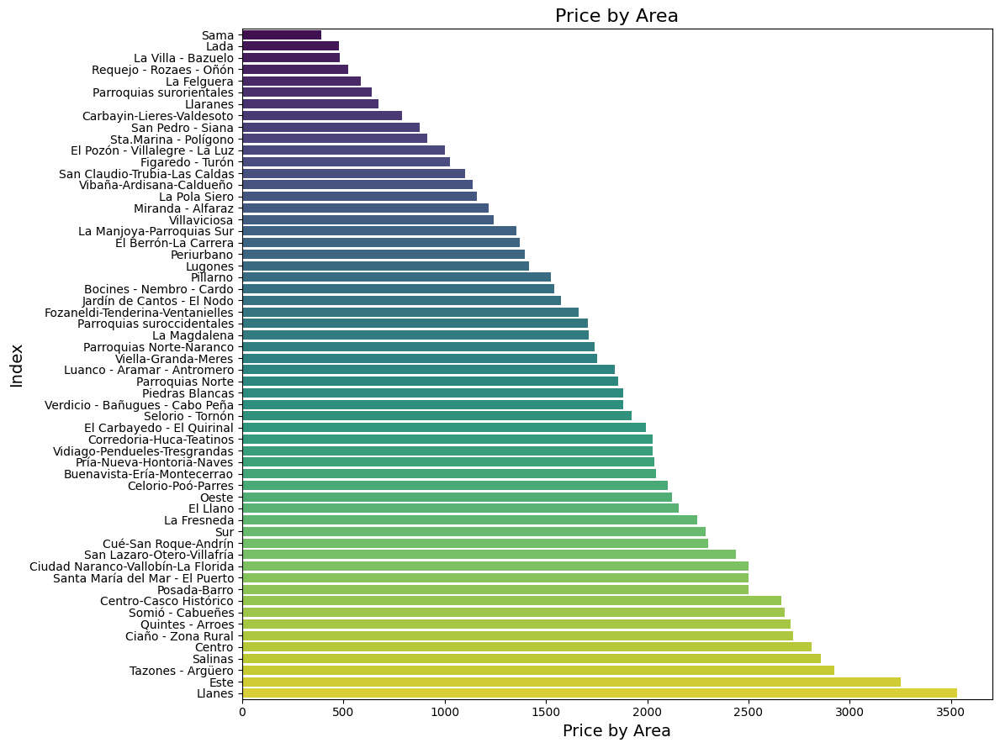

In [427]:
# Adjusting the size of the figure  ->  Ajustando el tamaño de la figura
plt.figure(figsize=(12, 9))

# Generating a horizontal bar chart  -> Generando un gráfico de barras horizontal
sns.barplot(x=value_m2.priceByArea, y=value_m2.index, orient='h', palette='viridis')

# # Adjusting the axes and adding titles and labels  -> Ajustando los ejes y agregando títulos y etiquetas
plt.title('Price by Area', fontsize=16)    # Chart title   -> Título del gráfico
plt.xlabel('Price by Area', fontsize=14)   # X-axis label  -> Etiqueta del eje X
plt.ylabel('Index', fontsize=14)           # Y-axis label  -> Etiqueta del eje Y

# Adjusting the spacing  -> Ajustando el espaciado
plt.tight_layout()

# Showing the chart  -> Mostrando el gráfico
plt.show()

### 5. miniEDA

In [428]:
# The following columns will not be necessary for the analysis, they do not influence the price
# Las siguientes columnas no serán necesarias para el análisis, no influyen en el precio.
'''
- operation: Not necessary, refers to the sale operation.
- country: Not necessary, the analysis is performed in Spain.
- labels, newDevelopmentFinished: Not necessary, many missing items.
- address, showaddress, distance: Not necessary, I will use the latitude and longitude.
- newDevelopment: Not necessary, has a 99.5% False.
- description: Not necessary, has duplicate information, the information is in the 'detailedType' column.
- suggestedTexts: Not necessary, has duplicate information, the information is in the 'detailedType' column.
- municipality, province: Not necessary, always in Asturias.
- priceByArea: closely related to the columns ('price'/'size').
- topNewDevelopment: Not necessary, has 100% False.
- superTopHighlight: Not necessary, has 100% False.
'''

"\n- operation: Not necessary, refers to the sale operation.\n- country: Not necessary, the analysis is performed in Spain.\n- labels, newDevelopmentFinished: Not necessary, many missing items.\n- address, showaddress, distance: Not necessary, I will use the latitude and longitude.\n- newDevelopment: Not necessary, has a 99.5% False.\n- description: Not necessary, has duplicate information, the information is in the 'detailedType' column.\n- suggestedTexts: Not necessary, has duplicate information, the information is in the 'detailedType' column.\n- municipality, province: Not necessary, always in Asturias.\n- priceByArea: closely related to the columns ('price'/'size').\n- topNewDevelopment: Not necessary, has 100% False.\n- superTopHighlight: Not necessary, has 100% False.\n"

In [429]:
info_idealista = ['Unnamed: 0', 'Unnamed: 0.1', 'propertyCode', 'thumbnail', 'change', 'highlight', 'savedAd', 'notes', 'topPlus', 'externalReference', 'numPhotos','url','hasPlan', 'has3DTour', 'has360', 'hasVideo','hasStaging']
operation = ['operation']
address = ['address', 'showAddress', 'distance','country']
missings = ['labels', 'newDevelopmentFinished','neighborhood','newDevelopment','topNewDevelopment', 'superTopHighlight']
asturias = ['municipality', 'province']
correlacion = ['priceByArea']                       # It can be used for further analysis
duplicated = ['suggestedTexts' ,'description']

In [430]:
delete_cols = info_idealista + operation + address + missings + asturias + correlacion + duplicated

In [431]:
# Visualizing X_train  -> Visualizando X_train
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 895 entries, 1061 to 3848
Data columns (total 45 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0.1            895 non-null    int64  
 1   Unnamed: 0              895 non-null    int64  
 2   propertyCode            895 non-null    int64  
 3   thumbnail               893 non-null    object 
 4   externalReference       823 non-null    object 
 5   numPhotos               895 non-null    int64  
 6   floor                   496 non-null    object 
 7   priceInfo               895 non-null    object 
 8   propertyType            895 non-null    object 
 9   operation               895 non-null    object 
 10  size                    895 non-null    float64
 11  exterior                480 non-null    object 
 12  rooms                   895 non-null    int64  
 13  bathrooms               895 non-null    int64  
 14  address                 895 non-null    obj

In [432]:
X_train.shape

(895, 45)

In [433]:
'''
Price and Outliers:
Generating a horizontal box plot showing the distribution of prices in the "price" column of the y_train DataFrame, allowing the 
visualization of the median, quartiles, and any outliers in the data.

Generando un diagrama de caja horizontal que muestra la distribución de los precios en la columna "price" del DataFrame y_train, permitiendo 
visualizar la mediana, los cuartiles y cualquier valor atípico en los datos.
'''

'\nPrice and Outliers:\nGenerating a horizontal box plot showing the distribution of prices in the "price" column of the y_train DataFrame, allowing the \nvisualization of the median, quartiles, and any outliers in the data.\n\nGenerando un diagrama de caja horizontal que muestra la distribución de los precios en la columna "price" del DataFrame y_train, permitiendo \nvisualizar la mediana, los cuartiles y cualquier valor atípico en los datos.\n'

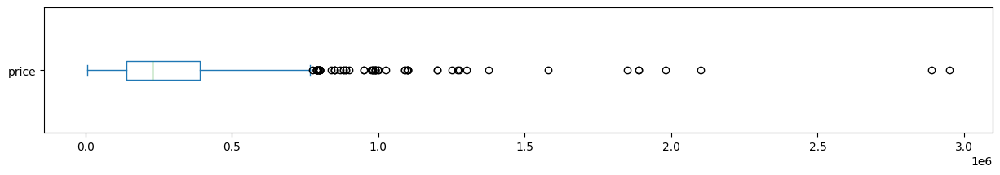

In [434]:
y_train.plot(kind="box", y="price",figsize=(15,2),vert=False); 

In [435]:
# Visualizing the number of outliers  -> Visualizando el número de outliers
len(apartments_asturias.loc[apartments_asturias.price>1000000]) # There are 25 outliers, almost 2.79% of the sample (895).

25

In [436]:
# Visualizing the most expensive outlier (La Manjoya-Parroquias Sur, Oviedo, Asturias)  -> Visualizando el outlier más caro (Oviedo, Asturias)
apartments_asturias[['size','district','price']].loc[apartments_asturias.price>2900000]

,size,district,price
2879,882.0,La Manjoya-Parroquias Sur,2950000.0


In [437]:
'''
We will work with some data preprocessing techniques used in data analysis and machine learning, in relation with the variables in some columns.

Trabajaremos con algunas técnicas de preprocesamiento de datos utilizada en el análisis de datos y en el aprendizaje automático, en  relación 
con las variable de algunas columnas.

'''

'\nWe will work with some data preprocessing techniques used in data analysis and machine learning, in relation with the variables in some columns.\n\nTrabajaremos con algunas técnicas de preprocesamiento de datos utilizada en el análisis de datos y en el aprendizaje automático, en  relación \ncon las variable de algunas columnas.\n\n'

##### **'propertyType' column**
Calculating the relative distribution (proportion) of each category in the 'propertyType' column of the X_train dataset with One Hot Encoding

In [438]:
# Calculating the different types of properties (propertyType) in the dataset X_train, expressed as proportions of the total
# Calculando los diferentes tipos de propiedades (propertyType) en el dataset X_train, expresada como proporciones del total

X_train.propertyType.value_counts(normalize=True)

propertyType
flat            0.491620
chalet          0.414525
duplex          0.036872
penthouse       0.025698
countryHouse    0.024581
studio          0.006704
Name: proportion, dtype: float64

<Axes: ylabel='count'>

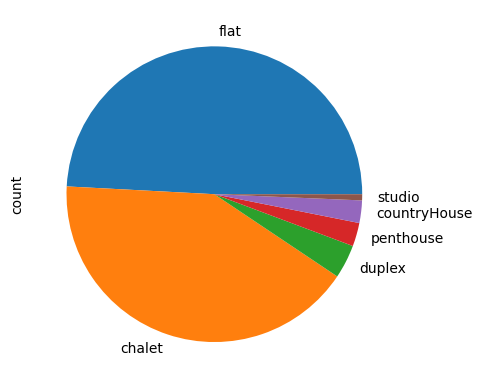

In [439]:
# Visualizing the proportion of different types of properties  -> Visualizando la proporción de diferentes tipos de propiedades
X_train.propertyType.value_counts().plot.pie()

In [440]:
# one hot encoding
one_hot = ['propertyType']

##### **'size' column**
Visualizing the distribution of the 'size' column to filter out excessively high values. Finally, we plan to standardize the data to prepare it for modeling

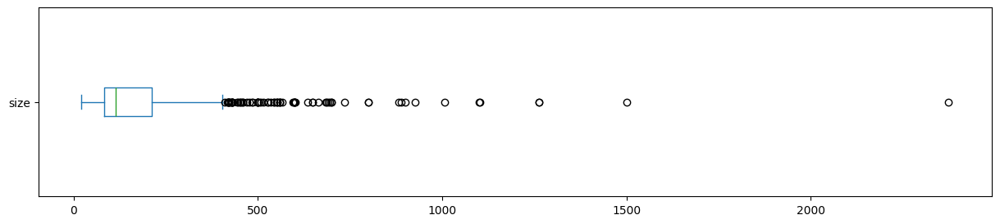

In [441]:
X_train.plot(kind="box", y="size",figsize=(15,3),vert=False);

In [442]:
X_train.loc[X_train['size'] > 2000]

,Unnamed: 0.1,Unnamed: 0,propertyCode,thumbnail,externalReference,numPhotos,floor,priceInfo,propertyType,operation,...,has360,hasStaging,highlight,savedAd,notes,topNewDevelopment,topPlus,neighborhood,parkingSpace,newDevelopmentFinished
3971,3971,21,98192806,https://img4.idealista.com/blur/WEB_LISTING/0/...,18965,137,NaN,"{'price': {'amount': 750000.0, 'currencySuffix...",chalet,sale,...,False,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN,NaN


In [444]:
# StandardScaler
escalar = ['size']

##### **'exterior' column**
Visualizing the values of the 'exterior' column, and create a list called 'booleanos', which contains the name of the 'exterior' column. This could probably be useful for applying similar operations to multiple columns, or if we needed to reference columns more flexibly.

In [445]:
X_train.exterior.isna().value_counts()  # This means that there are 480 non-null values, and 415 null values ​​in the exterior column.

exterior
False    480
True     415
Name: count, dtype: int64

In [446]:
booleanos = ['exterior']

##### **'rooms' column**
Visualizing the contents of the 'rooms' column and seeing which is the largest apartment

In [447]:
# The largest with 16 rooms at the price of 620,000 is a chalet (1100 m2)  -> el más grande con 16 habitaciones, precio 620.0000 (1100 m2)
X_train.loc[X_train.rooms==16]   

,Unnamed: 0.1,Unnamed: 0,propertyCode,thumbnail,externalReference,numPhotos,floor,priceInfo,propertyType,operation,...,has360,hasStaging,highlight,savedAd,notes,topNewDevelopment,topPlus,neighborhood,parkingSpace,newDevelopmentFinished
4820,4820,20,104502357,https://img4.idealista.com/blur/WEB_LISTING/0/...,w253,21,NaN,"{'price': {'amount': 620000.0, 'currencySuffix...",chalet,sale,...,True,False,{'groupDescription': 'Destacado'},{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN


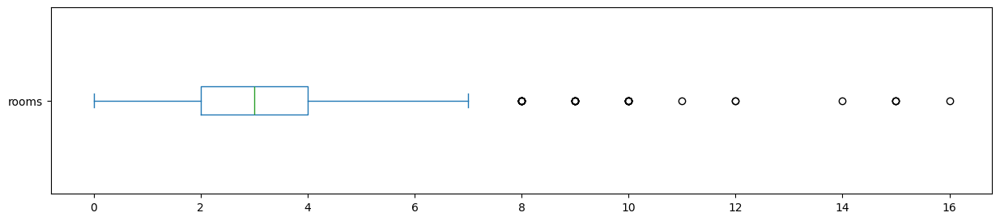

In [448]:
X_train.plot(kind="box", y="rooms",figsize=(15,3),vert=False); # There aren't many outliers  -> No hay muchos outliers

In [453]:
# StandardScaler
escalar.append('rooms')

##### **'bathrooms' column**
Visualizing the contents of the 'bathrooms'

In [454]:
# The largest with 12 bathrooms, price 738,000 (1103 m2)  -> El mas grande con 12 baños, precio 738.000 (1103 m2)
X_train.loc[X_train.bathrooms==12]

,Unnamed: 0.1,Unnamed: 0,propertyCode,thumbnail,externalReference,numPhotos,floor,priceInfo,propertyType,operation,...,has360,hasStaging,highlight,savedAd,notes,topNewDevelopment,topPlus,neighborhood,parkingSpace,newDevelopmentFinished
2430,2430,30,96216207,https://img4.idealista.com/blur/WEB_LISTING/0/...,10284,58,NaN,"{'price': {'amount': 738000.0, 'currencySuffix...",chalet,sale,...,False,False,{'groupDescription': 'Top'},{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN


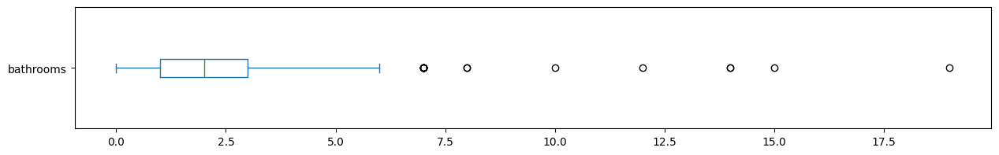

In [455]:
X_train.plot(kind="box", y="bathrooms",figsize=(15,2),vert=False);  # There aren't many outliers  -> No hay muchos outliers

In [456]:
# StandardScaler
escalar.append('bathrooms')

##### **'latitude, and longitude' columns**
Visualizing the latitude, and longitude

In [457]:
print(max(X_train.latitude))
print(min(X_train.latitude))
print(max(X_train.longitude))
print(min(X_train.longitude))

print('media latitud:', X_train.latitude.mean())
print('media longitud:', X_train.longitude.mean())

43.6240367
43.0436603
-4.6361851
-7.1563573
media latitud: 43.42367299396648
media longitud: -5.707675187150837


<Axes: xlabel='longitude', ylabel='latitude'>

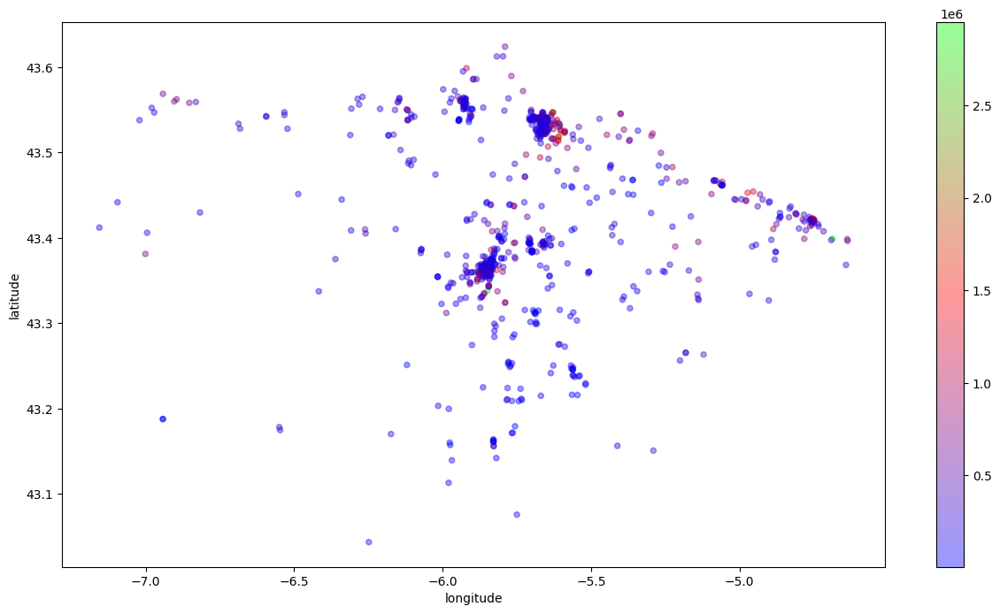

In [458]:
# Generating a scatter plot where the coordinates of the points are determined by longitude and latitude
X_train.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
        c=y_train, cmap='brg', colorbar=True, sharex=False, figsize=(15,8)) 

### Asturias as a background map and removing the Outliers to obtain better contrast.

In [459]:
import folium
import pandas as pd
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

In [460]:
# Selecting the desired columns to create a new dataset -> Seleccionando las columnas deseadaspara crear un nuevo dataset
df_price_coordinate = df_total[['price', 'latitude', 'longitude']]
df_price_coordinate

,price,latitude,longitude
0,60000.0,43.490000,-8.225648
1,9500.0,43.467858,-5.359872
2,9900.0,43.000891,-4.131428
3,125000.0,41.648496,-4.707003
4,85000.0,42.642826,-5.558800
...,...,...,...
4995,170000.0,43.399222,-5.394839
4996,275000.0,43.331961,-8.377670
4997,90000.0,43.248809,-5.773845
4998,186000.0,42.847557,-8.581143


In [461]:
df_price_coordinate.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   price      5000 non-null   float64
 1   latitude   5000 non-null   float64
 2   longitude  5000 non-null   float64
dtypes: float64(3)
memory usage: 117.3 KB


In [462]:
# Saving the new dataset 
df_price_coordinate.to_csv('C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/data_sample/price_coordinate.csv')

In [463]:
# Reading data from a CSV file
df_price_coordinate = pd.read_csv('C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/data_sample/price_coordinate.csv')

# Creating a Folium map focused on Asturias
mapa = folium.Map(location=[df_price_coordinate.latitude.mean(), df_price_coordinate.longitude.mean()], zoom_start=12)

# Defining the values ​​for the color gradient  -> Definiendo los valores para el gradiente de colores
values = df_price_coordinate['price']   
vmin, vmax = values.min(), values.max()

# Check if the maximum value minus 6000000 is still greater than or equal to the minimum value
if vmax - 6000000 >= vmin:
    vmax_adjusted = vmax - 6000000
else:
    vmax_adjusted = vmax  # Or set a fixed value

# Creating the custom color scale using the 'viridis' scale 
colormap = plt.cm.Reds

# Creating a function that converts values ​​in the range [vmin, vmax] to values ​​in the range [0, 1]
norm = mcolors.Normalize(vmin=vmin, vmax=vmax_adjusted) 


# Removing larger outliers to increase contrast between colors
color_function = lambda x: mcolors.rgb2hex(colormap(norm(x)))

# Adding markers for coordinate points
for _, row in df_price_coordinate.iterrows():
    valor = row['price']
    color = color_function(valor)
    folium.CircleMarker(location=[row['latitude'], row['longitude']], radius=2, color=color, fill_color=color).add_to(mapa)

# Displaying the map
display(mapa)

In [464]:
# StandardScaler
escalar.append('latitude')
escalar.append('longitude')

In [465]:
# Defining the values ​​for the color gradient  -> Definiendo los valores para el gradiente de colores
valores = df_price_coordinate['price']
vmin, vmax = valores.min(), valores.quantile(0.95)  # # Using the 95th percentile for vmax

# Creating the custom color scale using the 'viridis' scale 
colormap = plt.cm.YlOrRd

# Creating a function that converts values ​​in the range [vmin, vmax] to values ​​in the range [0, 1]
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
color_function = lambda x: mcolors.rgb2hex(colormap(norm(x)))

# Adding markers for coordinate points
for _, row in df_price_coordinate.iterrows():
    valor = row['price']
    color = color_function(valor)
    folium.CircleMarker(location=[row['latitude'], row['longitude']], radius=2, color=color, fill_color=color).add_to(mapa)

# Displaying the map
display(mapa)


##### **'status' column**
Analyzing and visualizing the 'status' column in a DataFrame, and preparing to transform the column into a format suitable for ML models using One Hot Encoding.

In [466]:
# Getting all unique values
X_train.status.unique()

array(['good', 'renew', nan, 'newdevelopment'], dtype=object)

In [467]:
# Counting the occurrences of each status
X_train.status.value_counts()

status
good              773
renew             118
newdevelopment      2
Name: count, dtype: int64

<Axes: ylabel='count'>

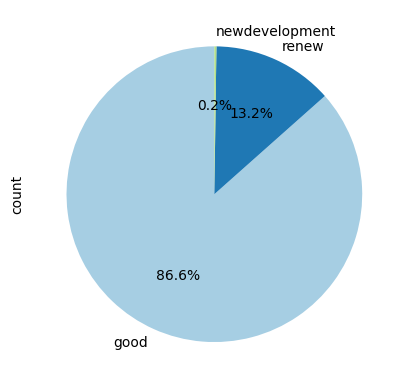

In [468]:
# Creating the the pie chart
X_train.status.value_counts().plot.pie(autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)

In [469]:
# One Hot Encoding
one_hot.append('status')

##### **'parkingSpace' column**
Analysing the 'parkingSpace' column to create two new columns:
- hasParkingSpace : 1 if there is parking available (True), and 0 if there is not (False).
- IncludedInPrice : 1 if parking is included in the price (True), and 0 if it is not (False).

In [470]:
# Identifying Null Values ​​(NaNs) in the 'parkingSpace' column
X_train.parkingSpace.isna().value_counts()   # Assuming that records with NaN indicate that they do not have parking.

parkingSpace
True     469
False    426
Name: count, dtype: int64

In [471]:
# Counting how many times each value appears in the 'parkingSpace' column. There are three possible
# There are three possible values: it has ParkingSpace, it has ParkingSpace and NOT be included in the Price, and 
# it has ParkingSpace and maybe be included in the Price

X_train.parkingSpace.value_counts()

parkingSpace
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': True}                                   402
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 20000.0}      4
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 24000.0}      3
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 10000.0}      3
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 17000.0}      2
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 16000.0}      2
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 25000.0}      2
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 15000.0}      2
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 35000.0}      2
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': F

In [472]:
# Creating the 'hasParkingSpace' column
X_train['hasParkingSpace'] = X_train.parkingSpace.notna().astype(int)           # 1 if there is parking available, and 0 if there is not.

# Creating the 'IncludedInPrice' column
X_train['IncludedInPrice'] = X_train.parkingSpace.apply(lambda x: 1 if x == 'incluido' else 0)  # 1 if parking is included in the price, and 0 if it is not.

In [473]:
X_train[['hasParkingSpace', 'IncludedInPrice']]

,hasParkingSpace,IncludedInPrice
1061,0,0
3251,1,0
2719,0,0
1600,1,0
2433,1,0
...,...,...
2668,0,0
807,0,0
4615,0,0
4892,0,0


##### **'detailedType' column**
Analyzing the 'detailedType' column to determine if it provides any information or should be removed

In [474]:
# Visualizing accounts of different types in detailedType
X_train.detailedType.value_counts()                           # Info of the "Typolgy" column contained in "propertyType".

detailedType
{'typology': 'flat'}                                           440
{'typology': 'chalet', 'subTypology': 'independantHouse'}      252
{'typology': 'chalet'}                                          42
{'typology': 'chalet', 'subTypology': 'semidetachedHouse'}      40
{'typology': 'chalet', 'subTypology': 'terracedHouse'}          37
{'typology': 'flat', 'subTypology': 'duplex'}                   33
{'typology': 'flat', 'subTypology': 'penthouse'}                23
{'typology': 'countryHouse', 'subTypology': 'casaDePueblo'}      9
{'typology': 'countryHouse', 'subTypology': 'casale'}            6
{'typology': 'countryHouse', 'subTypology': 'countryHouse'}      6
{'typology': 'flat', 'subTypology': 'studio'}                    6
{'typology': 'countryHouse', 'subTypology': 'palacio'}           1
Name: count, dtype: int64

In [475]:
# Visualizing the proportion of types that are neither 'flat' nor 'chalet'.
len(X_train.loc[(X_train.detailedType!="{'typology': 'flat'}")&(X_train.detailedType!="{'typology': 'chalet'}")])/X_train.shape[0]

0.46145251396648046

In [476]:
delete_cols.append('detailedType')

In [477]:
'''
The feature subtypology provides new information for 46% of cases.
'''

'\nThe feature subtypology provides new information for 46% of cases.\n'

##### **'floor' column**
Analyzing the 'floor' column to perform the following:
- Replace 'bj' and 'en' with 0 (zero)
- Replace 'ss' with '-1'
- Replace 'NaN', the 'chalets' with 0 (zero)
- Replace 'NaN', the 'flats' with the median

In [478]:
X_train.floor.value_counts()

floor
1     106
2      91
3      77
4      67
5      58
6      29
bj     29
7      14
8       9
9       5
en      5
10      3
14      2
16      1
Name: count, dtype: int64

In [479]:
# Replacing 'bj' and 'en' with 0 (zero), and 'ss' with '-1'
X_train['floor'] = X_train['floor'].replace({'bj': 0, 'en': 0})
X_train['floor'] = X_train['floor'].replace({'ss': -1})

print(X_train['floor'].value_counts())


floor
1     106
2      91
3      77
4      67
5      58
0      34
6      29
7      14
8       9
9       5
10      3
14      2
16      1
Name: count, dtype: int64


In [480]:
X_train.floor.isna().value_counts()

floor
False    496
True     399
Name: count, dtype: int64

In [481]:
# Selecting the rows where floor is NaN and propertyType is 'chalet' to assign the value 0 to the floor column for those rows.
X_train.loc[(X_train.floor.isna()) & (X_train.propertyType == 'chalet'), 'floor'] = 0

In [482]:
# Filling with the median

# First, getting the median of the 'floor' column for rows where the 'propertyType' is 'flat'
mediana_floor = X_train.loc[X_train.propertyType == 'flat', 'floor'].median()

# Now, we fill the NaN values ​​in the 'floor' column where 'propertyType' is 'flat'
X_train.loc[(X_train.floor.isna()) & (X_train.propertyType == 'flat'), 'floor'] = mediana_floor
X_train

,Unnamed: 0.1,Unnamed: 0,propertyCode,thumbnail,externalReference,numPhotos,floor,priceInfo,propertyType,operation,...,highlight,savedAd,notes,topNewDevelopment,topPlus,neighborhood,parkingSpace,newDevelopmentFinished,hasParkingSpace,IncludedInPrice
1061,1061,11,107049535,https://img4.idealista.com/blur/WEB_LISTING/0/...,VC0220,60,NaN,"{'price': {'amount': 75000.0, 'currencySuffix'...",countryHouse,sale,...,NaN,{},[],False,False,NaN,NaN,NaN,0,0
3251,3251,1,107601412,https://img4.idealista.com/blur/WEB_LISTING/0/...,3555_04426,47,0,"{'price': {'amount': 449000.0, 'currencySuffix...",chalet,sale,...,{'groupDescription': 'Top'},{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN,1,0
2719,2719,19,106157922,https://img4.idealista.com/blur/WEB_LISTING/0/...,piso calle asturias,35,4,"{'price': {'amount': 390000.0, 'currencySuffix...",duplex,sale,...,{'groupDescription': 'Top'},{},[],False,False,Parque San Francisco-Uría,NaN,NaN,0,0
1600,1600,0,107558758,https://img4.idealista.com/blur/WEB_LISTING/0/...,3235,29,6,"{'price': {'amount': 115000.0, 'currencySuffix...",penthouse,sale,...,NaN,{},[],False,False,Corredoria-La Carisa-Prado de La Vega,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN,1,0
2433,2433,33,104445139,https://img4.idealista.com/blur/WEB_LISTING/0/...,80356,169,0,"{'price': {'amount': 795000.0, 'currencySuffix...",chalet,sale,...,{'groupDescription': 'Top'},{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2668,2668,18,106998152,https://img4.idealista.com/blur/WEB_LISTING/0/...,3064,70,2,"{'price': {'amount': 270000.0, 'currencySuffix...",flat,sale,...,{'groupDescription': 'Top'},{},[],False,False,La Arena,NaN,NaN,0,0
807,807,7,107444823,https://img4.idealista.com/blur/WEB_LISTING/0/...,GJ1904,29,3,"{'price': {'amount': 229000.0, 'currencySuffix...",flat,sale,...,{'groupDescription': 'Top'},{},[],False,False,La Arena,NaN,NaN,0,0
4615,4615,15,103918514,https://img4.idealista.com/blur/WEB_LISTING/0/...,ES32052,19,0,"{'price': {'amount': 139000.0, 'currencySuffix...",chalet,sale,...,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN,NaN,0,0
4892,4892,42,88964456,https://img4.idealista.com/blur/WEB_LISTING/0/...,13214,34,0,"{'price': {'amount': 590000.0, 'currencySuffix...",chalet,sale,...,{'groupDescription': 'Destacado'},{},[],False,False,Castiello - Bernueces,NaN,NaN,0,0


##### **'district' column**
Analyzing the 'district' column


In [483]:
X_train.district.unique()

array(['Parroquias suroccidentales', 'San Claudio-Trubia-Las Caldas',
       'Centro-Casco Histórico', 'Corredoria-Huca-Teatinos', 'Centro',
       nan, 'Buenavista-Ería-Montecerrao', 'Llanes', 'Periurbano', 'Este',
       'Posada-Barro', 'Lugones', 'La Manjoya-Parroquias Sur',
       'Parroquias Norte-Naranco', 'Ciudad Naranco-Vallobín-La Florida',
       'Sur', 'San Pedro - Siana', 'La Pola Siero',
       'El Carbayedo - El Quirinal', 'Sta.Marina - Polígono',
       'Vibaña-Ardisana-Caldueño', 'Pría-Nueva-Hontoria-Naves',
       'Somió - Cabueñes', 'Parroquias Norte',
       'Fozaneldi-Tenderina-Ventanielles', 'Viella-Granda-Meres', 'Oeste',
       'El Pozón - Villalegre - La Luz', 'El Llano', 'Villaviciosa',
       'La Fresneda', 'La Felguera', 'Quintes - Arroes',
       'Bocines - Nembro - Cardo', 'Piedras Blancas', 'Miranda - Alfaraz',
       'Parroquias surorientales', 'Celorio-Poó-Parres',
       'Figaredo - Turón', 'Verdicio - Bañugues - Cabo Peña',
       'San Lazaro-Otero-Vil

In [484]:
X_train

,Unnamed: 0.1,Unnamed: 0,propertyCode,thumbnail,externalReference,numPhotos,floor,priceInfo,propertyType,operation,...,highlight,savedAd,notes,topNewDevelopment,topPlus,neighborhood,parkingSpace,newDevelopmentFinished,hasParkingSpace,IncludedInPrice
1061,1061,11,107049535,https://img4.idealista.com/blur/WEB_LISTING/0/...,VC0220,60,NaN,"{'price': {'amount': 75000.0, 'currencySuffix'...",countryHouse,sale,...,NaN,{},[],False,False,NaN,NaN,NaN,0,0
3251,3251,1,107601412,https://img4.idealista.com/blur/WEB_LISTING/0/...,3555_04426,47,0,"{'price': {'amount': 449000.0, 'currencySuffix...",chalet,sale,...,{'groupDescription': 'Top'},{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN,1,0
2719,2719,19,106157922,https://img4.idealista.com/blur/WEB_LISTING/0/...,piso calle asturias,35,4,"{'price': {'amount': 390000.0, 'currencySuffix...",duplex,sale,...,{'groupDescription': 'Top'},{},[],False,False,Parque San Francisco-Uría,NaN,NaN,0,0
1600,1600,0,107558758,https://img4.idealista.com/blur/WEB_LISTING/0/...,3235,29,6,"{'price': {'amount': 115000.0, 'currencySuffix...",penthouse,sale,...,NaN,{},[],False,False,Corredoria-La Carisa-Prado de La Vega,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN,1,0
2433,2433,33,104445139,https://img4.idealista.com/blur/WEB_LISTING/0/...,80356,169,0,"{'price': {'amount': 795000.0, 'currencySuffix...",chalet,sale,...,{'groupDescription': 'Top'},{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2668,2668,18,106998152,https://img4.idealista.com/blur/WEB_LISTING/0/...,3064,70,2,"{'price': {'amount': 270000.0, 'currencySuffix...",flat,sale,...,{'groupDescription': 'Top'},{},[],False,False,La Arena,NaN,NaN,0,0
807,807,7,107444823,https://img4.idealista.com/blur/WEB_LISTING/0/...,GJ1904,29,3,"{'price': {'amount': 229000.0, 'currencySuffix...",flat,sale,...,{'groupDescription': 'Top'},{},[],False,False,La Arena,NaN,NaN,0,0
4615,4615,15,103918514,https://img4.idealista.com/blur/WEB_LISTING/0/...,ES32052,19,0,"{'price': {'amount': 139000.0, 'currencySuffix...",chalet,sale,...,{'groupDescription': 'Destacado'},{},[],False,False,NaN,NaN,NaN,0,0
4892,4892,42,88964456,https://img4.idealista.com/blur/WEB_LISTING/0/...,13214,34,0,"{'price': {'amount': 590000.0, 'currencySuffix...",chalet,sale,...,{'groupDescription': 'Destacado'},{},[],False,False,Castiello - Bernueces,NaN,NaN,0,0


C:\Users\argpe\AppData\Local\Temp\ipykernel_18412\1854360682.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=y_train, y=X_train.district, orient='h', palette='viridis')


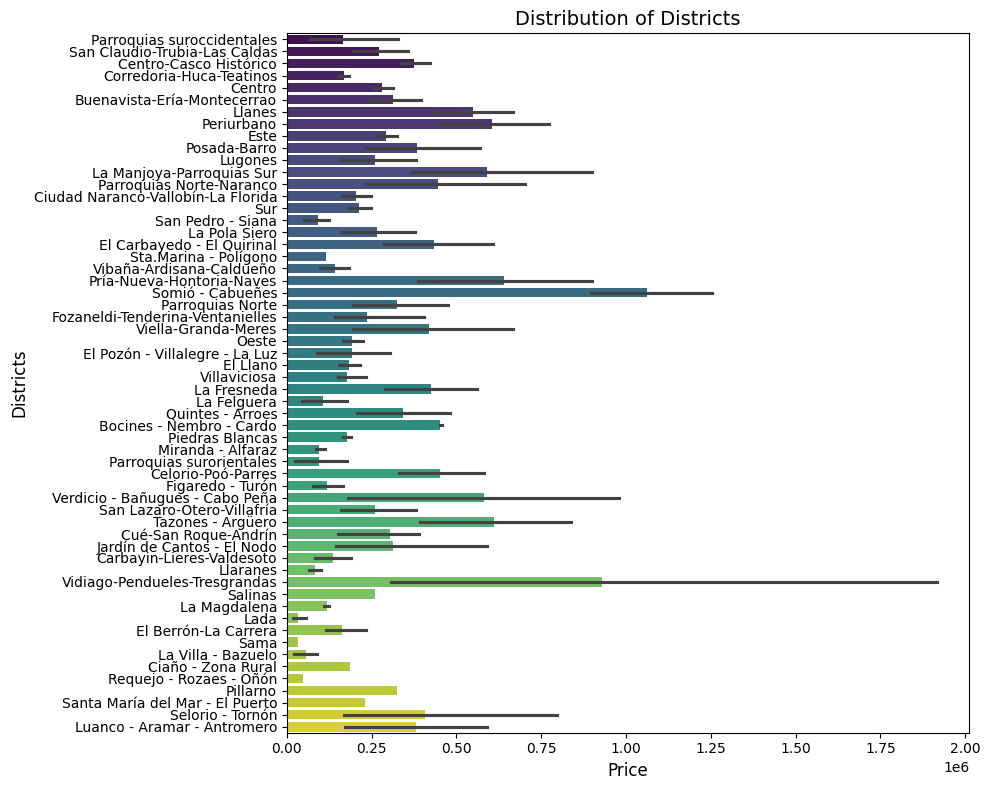

In [485]:
# Setting the chart size
plt.figure(figsize=(10, 8))

# Creating the bar chart
sns.barplot(x=y_train, y=X_train.district, orient='h', palette='viridis')

# Adding title and labels to the axes
plt.title('Distribution of Districts', fontsize=14)
plt.xlabel('Price', fontsize=12)
plt.ylabel('Districts', fontsize=12)

# Improving ticks readability
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Showing the graph
plt.tight_layout()      # Adjusting the layout to avoid overlaps
plt.show()

In [486]:
# Adding the string 'district' to a list called one_hot  -> Agregando la cadena 'district' a una lista llamada one_hot
one_hot.append('district')

##### **'hasLift' column**
Analyzing the 'hasLift' column (Booleans)

In [487]:
# Counting the number of missing values ​​in the hasLift column
X_train.hasLift.isna().sum()

398

In [488]:
# Counting the number of occurrences
X_train.hasLift.value_counts()   # There are 424 instances where hasLift is True, and 73 instances where hasLift is False.

hasLift
True     424
False     73
Name: count, dtype: int64

In [489]:
'''
if True = 1
if False = 0'
'''

"\nif True = 1\nif False = 0'\n"

In [490]:
# Creating the DataFrame 'isna', which contains all rows of X_train where the hasLift column has missing values ​​(NaN)
isna = X_train.loc[X_train.hasLift.isna()]

In [491]:
isna.propertyType.value_counts() 
# if chalet = 0 
# flat = 0 -> Assume they don't have

propertyType
chalet          371
countryHouse     22
flat              4
studio            1
Name: count, dtype: int64

In [492]:
isna.loc[isna.propertyType=='flat'] 

,Unnamed: 0.1,Unnamed: 0,propertyCode,thumbnail,externalReference,numPhotos,floor,priceInfo,propertyType,operation,...,highlight,savedAd,notes,topNewDevelopment,topPlus,neighborhood,parkingSpace,newDevelopmentFinished,hasParkingSpace,IncludedInPrice
1299,1299,49,107345547,https://img4.idealista.com/blur/WEB_LISTING/0/...,REF-677 PISO,36,2.0,"{'price': {'amount': 263000.0, 'currencySuffix...",flat,sale,...,NaN,{},[],False,False,NaN,NaN,NaN,0,0
1668,1668,18,106660887,https://img4.idealista.com/blur/WEB_LISTING/0/...,VI-000-020-716-202,27,4,"{'price': {'amount': 181500.0, 'currencySuffix...",flat,sale,...,NaN,{},[],False,False,Milán-Pumarín,NaN,NaN,0,0
288,288,38,94344447,https://img4.idealista.com/blur/WEB_LISTING/0/...,2054##01402677,5,2.0,"{'price': {'amount': 12000.0, 'currencySuffix'...",flat,sale,...,NaN,{},[],False,False,NaN,NaN,NaN,0,0
1332,1332,32,105655507,https://img4.idealista.com/blur/WEB_LISTING/0/...,9197##9197_0004_PE0001,8,2.0,"{'price': {'amount': 91020.0, 'currencySuffix'...",flat,sale,...,NaN,{},[],False,False,NaN,"{'hasParkingSpace': True, 'isParkingSpaceInclu...",NaN,1,0


In [493]:
# Adding the 'hasLift' to a list called 'booleanos'  -> Agregando la 'hasLift' a una lista llamada 'booleanos'
booleanos.append('hasLift')

## Executing each task of the analysis performed above (miniEDA)

##### **'floor' column**

In [494]:
# Replacing 'bj' and 'en' with 0 (zero), and 'ss' with '-1'
X_train['floor'] = X_train['floor'].replace({'bj': 0, 'en': 0})
X_train['floor'] = X_train['floor'].replace({'ss': -1})

# Replacing 'ss' and 'st' with 1
X_train['floor'] = X_train['floor'].replace('ss', -1)  # I have removed the use of inplace=True in the replace() calls and assigned the result directly to X_train['floor'].
X_train['floor'] = X_train['floor'].replace('st', -1)

# Filling NaN values ​​in the 'floor' column with 0 for chalets
X_train.loc[(X_train.floor.isna()) & (X_train.propertyType == 'chalet'), 'floor'] = 0


In [495]:
# Visualizing the median of the flats
X_train[(X_train.propertyType=='flat')]['floor'].notna().astype(int).median()

1.0

In [496]:
X_train['floor']

1061    NaN
3251      0
2719      4
1600      6
2433      0
       ... 
2668      2
807       3
4615      0
4892      0
3848      0
Name: floor, Length: 895, dtype: object

In [497]:
# Replacing NaN values ​​in the 'flats' column with the value 1
X_train['floor'].fillna(1, inplace=True)


In [498]:
# Displaying 'floor' column
X_train['floor']

1061    1
3251    0
2719    4
1600    6
2433    0
       ..
2668    2
807     3
4615    0
4892    0
3848    0
Name: floor, Length: 895, dtype: object

In [499]:
X_train.floor = X_train.floor.astype(int)

In [500]:
# Adding a column to Scale
escalar.append('floor')

##### **'parkingSpace' column**

In [501]:
# If NaN, assume this does not have a garage
X_train['parkingSpace'] = X_train['parkingSpace'].fillna('0')
parking = X_train['parkingSpace'].str.split(",", expand=True)

# Renaming columns to avoid confusion
parking = parking.rename(columns={0: 'hasParkingSpace', 1: 'IncludedInPrice'})

# if it is not 0, then it is 1
parking['hasParkingSpace'] = parking['hasParkingSpace'].replace(["{'hasParkingSpace': True"], '1')

# Transforming the values ​​of the 'hasParkingSpace' column from booleans to integers (enteros), True = 1, and False = 0
parking['hasParkingSpace'] = parking['hasParkingSpace'].astype(int)

# 1 if included, 0 if not, for a clearer and more consistent representation of whether parking is included in the price or not
parking['IncludedInPrice'] = parking['IncludedInPrice'].fillna('0')  # Replaces NaN values ​​(representing missing or None values)
parking['IncludedInPrice'] = parking['IncludedInPrice'].replace([" 'isParkingSpaceIncludedInPrice': True}"], '1')
parking['IncludedInPrice'] = parking['IncludedInPrice'].replace([" 'isParkingSpaceIncludedInPrice': False"], '0')

# Converting all values ​​in the 'IncludedInPrice' column to integers (enteros)
parking['IncludedInPrice'] = parking['IncludedInPrice'].astype(int)

# Removing the 'garage price' column, I'm not interested
parking.drop(2, axis=1, inplace=True)  # Deleting the column with index 2.

# Merging information from another DataFrame (parking) into the main DataFrame (X_train), adding two new columns containing parking-related data
X_train['hasParkingSpace'] = parking['hasParkingSpace']
X_train['IncludedInPrice'] = parking['IncludedInPrice']


In [502]:
# Adding the 'parkingSpace' to the delete_cols list
delete_cols.append('parkingSpace')

##### **'priceInfo' column**
Working on the column because it has data in a dictionary format. To fix this, we'll extract the information from priceInfo, remove the original priceInfo column, and ensure all columns are numeric.

In [ ]:
# First, converting 'priceInfo' into numeric columns
X_train['price_amount'] = X_train['priceInfo'].apply(lambda x: eval(x)['price']['amount'])

# priceDropInfo' is not be considered
#X_train['price_drop_value'] = X_train['priceInfo'].apply(lambda x: eval(x).get('price', {}).get('priceDropInfo', {}).get('priceDropValue', 0))
#X_train['former_price'] = X_train['priceInfo'].apply(lambda x: eval(x).get('price', {}).get('priceDropInfo', {}).get('formerPrice', 0))
#X_train['price_drop_percentage'] = X_train['priceInfo'].apply(lambda x: eval(x).get('price', {}).get('priceDropInfo', {}).get('priceDropPercentage', 0))

# Deleting the original column
X_train.drop('priceInfo', axis=1, inplace=True)


## Task grouping based on the analysis performed previously (miniEDA)

##### **StandardScaler**

In [505]:
# Visualizing
escalar

['size',
 'rooms',
 'bathrooms',
 'rooms',
 'bathrooms',
 'latitude',
 'longitude',
 'floor']

In [506]:
# Standardizing the characteristics of a dataset
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [507]:
# Scaling the selected features in X_train
X_train[escalar] = scaler.fit_transform(X_train[escalar])

##### **Booleanos**

In [508]:
# Visualizing
booleanos

['exterior', 'hasLift']

In [509]:
# Ensuring that all missing values ​​in the 'hasLift' column of X_train are set to 0
X_train['hasLift'] = X_train['hasLift'].fillna(0)

In [510]:
print(X_train['hasLift'].isnull().sum())

0


In [511]:
# Replacing NaN values ​​with a specific value (e.g., 0)
X_train[booleanos] = X_train[booleanos].fillna(0)             # Replacing NaN values with 0
X_train[booleanos] = X_train[booleanos].astype(int)           # Converting to integers (enteros)


In [512]:
# Transforming the boolean values ​​(True/False) in X_train indicated by booleans to integer values ​​(1/0).
X_train[booleanos] = X_train[booleanos].astype(int)


##### **One Hot Encoding**

In [514]:
# Visualizing
one_hot

['propertyType', 'status', 'district']

In [515]:
X_train = pd.get_dummies(X_train, columns = one_hot)

##### **delete_cols**
Deleting columns

In [516]:
# Checking the available columns in X_train
X_train.columns.tolist()

['Unnamed: 0.1',
 'Unnamed: 0',
 'propertyCode',
 'thumbnail',
 'externalReference',
 'numPhotos',
 'floor',
 'operation',
 'size',
 'exterior',
 'rooms',
 'bathrooms',
 'address',
 'province',
 'municipality',
 'country',
 'latitude',
 'longitude',
 'showAddress',
 'url',
 'distance',
 'description',
 'hasVideo',
 'newDevelopment',
 'hasLift',
 'priceByArea',
 'change',
 'detailedType',
 'suggestedTexts',
 'hasPlan',
 'has3DTour',
 'has360',
 'hasStaging',
 'highlight',
 'savedAd',
 'notes',
 'topNewDevelopment',
 'topPlus',
 'neighborhood',
 'parkingSpace',
 'newDevelopmentFinished',
 'hasParkingSpace',
 'IncludedInPrice',
 'price_amount',
 'propertyType_chalet',
 'propertyType_countryHouse',
 'propertyType_duplex',
 'propertyType_flat',
 'propertyType_penthouse',
 'propertyType_studio',
 'status_good',
 'status_newdevelopment',
 'status_renew',
 'district_Bocines - Nembro - Cardo',
 'district_Buenavista-Ería-Montecerrao',
 'district_Carbayin-Lieres-Valdesoto',
 'district_Celorio-Poó

In [517]:
# Visualizing 'delete_cols'
delete_cols

['Unnamed: 0',
 'Unnamed: 0.1',
 'propertyCode',
 'thumbnail',
 'change',
 'highlight',
 'savedAd',
 'notes',
 'topPlus',
 'externalReference',
 'numPhotos',
 'url',
 'hasPlan',
 'has3DTour',
 'has360',
 'hasVideo',
 'hasStaging',
 'operation',
 'address',
 'showAddress',
 'distance',
 'country',
 'labels',
 'newDevelopmentFinished',
 'neighborhood',
 'newDevelopment',
 'topNewDevelopment',
 'superTopHighlight',
 'municipality',
 'province',
 'priceByArea',
 'suggestedTexts',
 'description',
 'detailedType',
 'parkingSpace']

In [518]:
# Deleting the columns that are in delete_cols
X_train = X_train.drop(columns=delete_cols, errors='ignore')

In [519]:
X_train.columns.tolist()

['floor',
 'size',
 'exterior',
 'rooms',
 'bathrooms',
 'latitude',
 'longitude',
 'hasLift',
 'hasParkingSpace',
 'IncludedInPrice',
 'price_amount',
 'propertyType_chalet',
 'propertyType_countryHouse',
 'propertyType_duplex',
 'propertyType_flat',
 'propertyType_penthouse',
 'propertyType_studio',
 'status_good',
 'status_newdevelopment',
 'status_renew',
 'district_Bocines - Nembro - Cardo',
 'district_Buenavista-Ería-Montecerrao',
 'district_Carbayin-Lieres-Valdesoto',
 'district_Celorio-Poó-Parres',
 'district_Centro',
 'district_Centro-Casco Histórico',
 'district_Ciaño - Zona Rural',
 'district_Ciudad Naranco-Vallobín-La Florida',
 'district_Corredoria-Huca-Teatinos',
 'district_Cué-San Roque-Andrín',
 'district_El Berrón-La Carrera',
 'district_El Carbayedo - El Quirinal',
 'district_El Llano',
 'district_El Pozón - Villalegre - La Luz',
 'district_Este',
 'district_Figaredo - Turón',
 'district_Fozaneldi-Tenderina-Ventanielles',
 'district_Jardín de Cantos - El Nodo',
 'dist

In [520]:
# Visualizing 'X_train'
X_train

,floor,size,exterior,rooms,bathrooms,latitude,longitude,hasLift,hasParkingSpace,IncludedInPrice,...,district_Selorio - Tornón,district_Somió - Cabueñes,district_Sta.Marina - Polígono,district_Sur,district_Tazones - Argüero,district_Verdicio - Bañugues - Cabo Peña,district_Vibaña-Ardisana-Caldueño,district_Vidiago-Pendueles-Tresgrandas,district_Viella-Granda-Meres,district_Villaviciosa
1061,-0.334869,-0.622444,0,-1.314658,-0.765058,0.348794,0.525095,0,0,0,...,False,False,False,False,False,False,False,False,False,False
3251,-0.774970,0.026035,0,0.290552,-0.133391,-0.630527,-0.572051,0,1,1,...,False,False,False,False,False,False,False,False,False,False
2719,0.985431,-0.378572,1,-0.244518,-0.133391,-0.568910,-0.407041,1,0,0,...,False,False,False,False,False,False,False,False,False,False
1600,1.865631,-0.705582,1,-1.314658,-0.765058,-0.376955,-0.317739,1,1,1,...,False,False,False,False,False,False,False,False,False,False
2433,-0.774970,2.126662,0,2.430831,1.761610,-0.746695,-0.547086,0,1,1,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2668,0.105231,-0.483880,1,0.290552,-0.133391,1.147493,0.162397,1,0,0,...,False,False,False,False,False,False,False,False,False,False
807,0.545331,-0.539306,1,-0.244518,-0.765058,1.154569,0.153189,1,0,0,...,False,False,False,False,False,False,False,False,False,False
4615,-0.774970,-0.190125,0,-0.244518,1.129943,1.189610,-1.084411,0,0,0,...,False,False,False,False,False,False,False,False,False,False
4892,-0.774970,0.929470,0,1.360692,1.129943,0.914666,0.200538,0,0,0,...,False,False,False,False,False,False,False,False,False,False


In [521]:
# Saving the X_train dataset 
X_train.to_csv('C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/data_sample/X_train.csv')

## Applying transformations to X_test

##### **'floor' column**

In [522]:
# Replacing 'bj' and 'en' with 0 (zero), and 'ss' with '-1'
X_test['floor'] = X_test['floor'].replace({'bj': 0, 'en': 0, 'ss': -1})

# Replacing 'ss' and 'st' with 1
X_test['floor'] = X_test['floor'].replace('st', -1)

# Filling NaN values ​​in the 'floor' column with 0 for chalets
X_test.loc[(X_test['floor'].isna()) | (X_test['propertyType'] == 'chalet'), 'floor'] = 0

# 'NaN' values ​​- replacing 'flats' with 1
X_test['floor'] = X_test['floor'].fillna(1)

# Ensuring that the values ​​in 'floor' are integers (enteros)
X_test['floor'] = X_test['floor'].astype(int)


##### **'parkingSpace' column**

In [523]:
# If NaN, assume this does not have a garage
X_test['parkingSpace'] = X_test['parkingSpace'].fillna('0')
parking_test = X_test['parkingSpace'].str.split(",", expand=True)

# Renaming columns to avoid confusion
parking_test = parking_test.rename(columns={0: 'hasParkingSpace', 1: 'IncludedInPrice'})

# if it is not 0, then it is 1
parking_test['hasParkingSpace'] = parking_test['hasParkingSpace'].replace(["{'hasParkingSpace': True"], '1')

# Transforming the values ​​of the 'hasParkingSpace' column from booleans to integers (enteros), True = 1, and False = 0
parking_test['hasParkingSpace'] = parking_test['hasParkingSpace'].astype(int)

# 1 if included, 0 if not, for a clearer and more consistent representation of whether parking is included in the price or not
parking_test['IncludedInPrice'] = parking_test['IncludedInPrice'].fillna('0')  # Replaces NaN values ​​(representing missing or None values)
parking_test['IncludedInPrice'] = parking_test['IncludedInPrice'].replace([" 'isParkingSpaceIncludedInPrice': True}"], '1')
parking_test['IncludedInPrice'] = parking_test['IncludedInPrice'].replace([" 'isParkingSpaceIncludedInPrice': False"], '0')

# Converting all values ​​in the 'IncludedInPrice' column to integers (enteros)
parking_test['IncludedInPrice'] = parking_test['IncludedInPrice'].astype(int)

# Removing the 'garage price' column, I'm not interested
parking_test.drop(2, axis=1, inplace=True)  # Deleting the column with index 2.

# Merging information from another DataFrame (parking) into the main DataFrame (X_train), adding two new columns containing parking-related data
X_test['hasParkingSpace'] = parking_test['hasParkingSpace']
X_test['IncludedInPrice'] = parking_test['IncludedInPrice']

##### **'priceInfo' column**

In [524]:
# First, converting 'priceInfo' into numeric columns
X_test['price_amount'] = X_test['priceInfo'].apply(lambda x: eval(x)['price']['amount'])

# priceDropInfo' is to be considered, so we extract it
#X_test['price_drop_value'] = X_test['priceInfo'].apply(lambda x: eval(x).get('price', {}).get('priceDropInfo', {}).get('priceDropValue', 0))
#X_test['former_price'] = X_test['priceInfo'].apply(lambda x: eval(x).get('price', {}).get('priceDropInfo', {}).get('formerPrice', 0))
#X_test['price_drop_percentage'] = X_test['priceInfo'].apply(lambda x: eval(x).get('price', {}).get('priceDropInfo', {}).get('priceDropPercentage', 0))

# Deleting the original column
X_test.drop('priceInfo', axis=1, inplace=True)

##### **StandardScaler**

In [525]:
# Scaling the selected features in X_test
X_test[escalar] = scaler.fit_transform(X_test[escalar])

##### **Booleanos**

In [527]:
# Ensuring that all missing values ​​in the 'hasLift' column of X_test are set to 0
X_test['hasLift'] = X_test['hasLift'].fillna(0)

# replacing NaN values ​​with a specific value (e.g., 0)
X_test[booleanos] = X_test[booleanos].fillna(0).astype(int)

# Transforming the boolean values ​​(True/False) in X_test indicated by booleans to integer values ​​(1/0).
X_test[booleanos] = X_test[booleanos].astype(int)

##### **One Hot Encoding**

In [528]:
X_test = pd.get_dummies(X_test, columns = one_hot)

##### **Delete Columns**

In [529]:
# Checking the available columns in X_test
X_test.columns.tolist()

# Visualizing 'delete_cols'
delete_cols

# Deleting the columns that are in delete_cols
X_test = X_test.drop(columns=delete_cols, errors='ignore')

In [530]:
# Visualizing 'X_test'
X_test

,floor,size,exterior,rooms,bathrooms,latitude,longitude,hasLift,hasParkingSpace,IncludedInPrice,...,district_Requejo - Rozaes - Oñón,district_San Claudio-Trubia-Las Caldas,district_San Lazaro-Otero-Villafría,district_San Pedro - Siana,district_Selorio - Tornón,district_Somió - Cabueñes,district_Sur,district_Tazones - Argüero,district_Vidiago-Pendueles-Tresgrandas,district_Viella-Granda-Meres
1483,0.518591,-0.767395,1,-1.104933,-0.749477,-0.423368,-0.384806,1,1,1,...,False,False,False,False,False,False,False,False,False,False
671,-0.302359,-0.802159,1,-1.540681,-0.749477,-0.501056,-0.429397,1,0,0,...,False,False,False,False,False,False,False,False,False,False
4288,-0.712833,1.330035,0,-0.669185,0.532072,0.132316,0.034114,0,1,1,...,False,False,False,False,False,False,False,False,False,False
4704,0.929066,-0.489283,1,-0.233437,-0.108703,1.298571,-0.586129,1,0,0,...,False,False,False,False,False,False,False,False,False,False
2870,-0.712833,0.988188,0,0.202312,0.532072,1.162292,0.778024,0,1,1,...,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,2.981439,-0.274905,1,-0.233437,-0.108703,1.230899,0.072275,1,1,1,...,False,False,False,False,False,False,False,False,False,False
4683,-0.712833,1.892053,0,1.945304,2.454396,0.337543,1.553753,0,1,1,...,False,False,False,False,False,False,False,False,False,False
3150,0.929066,-0.744219,1,-1.104933,-0.749477,-0.521691,-0.425931,1,0,0,...,False,False,False,False,False,False,False,False,False,False
3089,-0.712833,0.269732,0,0.202312,-0.108703,0.753755,0.064984,0,0,0,...,False,False,False,False,False,False,False,False,False,False


In [531]:
# Saving the X_test dataset 
X_test.to_csv('C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/data_sample/X_test.csv')

##### Verifying that the dimensions of X_train and X_test are correct and that both matrices match the number of columns

In [547]:
# Getting the columns of X_train and X_test
columnas_X_train = X_train.columns.tolist()
columnas_X_test = X_test.columns.tolist()

In [548]:
# Comparing the two lists of columns
# Converting lists to sets for easier comparison
set_X_train = set(columnas_X_train)
set_X_test = set(columnas_X_test)

# Identifying columns that are in X_train but not in X_test and vice versa
columnas_en_X_train_no_en_X_test = set_X_train - set_X_test
columnas_en_X_test_no_en_X_train = set_X_test - set_X_train

In [549]:
# Displaying missing columns
print("Columnas en X_train pero no en X_test:")
print(columnas_en_X_train_no_en_X_test)

print("Columnas en X_test pero no en X_train:")
print(columnas_en_X_test_no_en_X_train)

Columnas en X_train pero no en X_test:
{'district_Salinas', 'district_Llaranes', 'district_Sama', 'district_Villaviciosa', 'district_Bocines - Nembro - Cardo', 'district_Verdicio - Bañugues - Cabo Peña', 'district_Santa María del Mar - El Puerto', 'district_Miranda - Alfaraz', 'district_Vibaña-Ardisana-Caldueño', 'district_La Magdalena', 'district_Lada', 'district_Ciaño - Zona Rural', 'district_Sta.Marina - Polígono'}
Columnas en X_test pero no en X_train:
set()


In [ ]:
# Identifying the columns to be deleted
columns_to_delete = ['district_Salinas', 'district_Llaranes', 'district_Sama', 
                       'district_Villaviciosa', 'district_Bocines - Nembro - Cardo', 
                       'district_Verdicio - Bañugues - Cabo Peña', 
                       'district_Santa María del Mar - El Puerto', 
                       'district_Miranda - Alfaraz', 
                       'district_Vibaña-Ardisana-Caldueño', 
                       'district_La Magdalena', 'district_Lada', 
                       'district_Ciaño - Zona Rural', 
                       'district_Sta.Marina - Polígono']

# Removing columns from X_train that are not in X_test
X_train = X_train.drop(columns=columns_to_delete, errors='ignore')


In [ ]:
# Verifying that the columns match
assert set(X_train.columns) == set(X_test.columns), "The X_train and X_test columns do not match."


In [ ]:
'''
Now both matrices match
'''

In [557]:
X_train

,floor,size,exterior,rooms,bathrooms,latitude,longitude,hasLift,hasParkingSpace,IncludedInPrice,...,district_Requejo - Rozaes - Oñón,district_San Claudio-Trubia-Las Caldas,district_San Lazaro-Otero-Villafría,district_San Pedro - Siana,district_Selorio - Tornón,district_Somió - Cabueñes,district_Sur,district_Tazones - Argüero,district_Vidiago-Pendueles-Tresgrandas,district_Viella-Granda-Meres
1061,-0.334869,-0.622444,0,-1.314658,-0.765058,0.348794,0.525095,0,0,0,...,False,False,False,False,False,False,False,False,False,False
3251,-0.774970,0.026035,0,0.290552,-0.133391,-0.630527,-0.572051,0,1,1,...,False,True,False,False,False,False,False,False,False,False
2719,0.985431,-0.378572,1,-0.244518,-0.133391,-0.568910,-0.407041,1,0,0,...,False,False,False,False,False,False,False,False,False,False
1600,1.865631,-0.705582,1,-1.314658,-0.765058,-0.376955,-0.317739,1,1,1,...,False,False,False,False,False,False,False,False,False,False
2433,-0.774970,2.126662,0,2.430831,1.761610,-0.746695,-0.547086,0,1,1,...,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2668,0.105231,-0.483880,1,0.290552,-0.133391,1.147493,0.162397,1,0,0,...,False,False,False,False,False,False,False,False,False,False
807,0.545331,-0.539306,1,-0.244518,-0.765058,1.154569,0.153189,1,0,0,...,False,False,False,False,False,False,False,False,False,False
4615,-0.774970,-0.190125,0,-0.244518,1.129943,1.189610,-1.084411,0,0,0,...,False,False,False,False,False,False,False,False,False,False
4892,-0.774970,0.929470,0,1.360692,1.129943,0.914666,0.200538,0,0,0,...,False,False,False,False,False,False,False,False,False,False


In [558]:
X_test

,floor,size,exterior,rooms,bathrooms,latitude,longitude,hasLift,hasParkingSpace,IncludedInPrice,...,district_Requejo - Rozaes - Oñón,district_San Claudio-Trubia-Las Caldas,district_San Lazaro-Otero-Villafría,district_San Pedro - Siana,district_Selorio - Tornón,district_Somió - Cabueñes,district_Sur,district_Tazones - Argüero,district_Vidiago-Pendueles-Tresgrandas,district_Viella-Granda-Meres
1483,0.518591,-0.767395,1,-1.104933,-0.749477,-0.423368,-0.384806,1,1,1,...,False,False,False,False,False,False,False,False,False,False
671,-0.302359,-0.802159,1,-1.540681,-0.749477,-0.501056,-0.429397,1,0,0,...,False,False,False,False,False,False,False,False,False,False
4288,-0.712833,1.330035,0,-0.669185,0.532072,0.132316,0.034114,0,1,1,...,False,False,False,False,False,False,False,False,False,False
4704,0.929066,-0.489283,1,-0.233437,-0.108703,1.298571,-0.586129,1,0,0,...,False,False,False,False,False,False,False,False,False,False
2870,-0.712833,0.988188,0,0.202312,0.532072,1.162292,0.778024,0,1,1,...,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,2.981439,-0.274905,1,-0.233437,-0.108703,1.230899,0.072275,1,1,1,...,False,False,False,False,False,False,False,False,False,False
4683,-0.712833,1.892053,0,1.945304,2.454396,0.337543,1.553753,0,1,1,...,False,False,False,False,False,False,False,False,False,False
3150,0.929066,-0.744219,1,-1.104933,-0.749477,-0.521691,-0.425931,1,0,0,...,False,False,False,False,False,False,False,False,False,False
3089,-0.712833,0.269732,0,0.202312,-0.108703,0.753755,0.064984,0,0,0,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Saving the X_train dataset 
X_train.to_csv('C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/data_sample/X_train.csv')

In [560]:
# Saving the X_test dataset 
X_test.to_csv('C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/data_sample/X_test.csv')

### 6. Model training

In [561]:
# Import
from sklearn.metrics import mean_absolute_error     # Error measurement in the units of the variable
from sklearn.metrics import mean_squared_error      # Model Comparison

#### 6.1. RandomForestRegressor

In [562]:
from sklearn.ensemble import RandomForestRegressor

rnd_reg = RandomForestRegressor(n_estimators=500,
                               max_depth=5,
                               random_state=42)
rnd_reg.fit(X_train, 
           y_train)

RandomForestRegressor(max_depth=5, n_estimators=500, random_state=42)

In [564]:
# Getting the model predictions for both X_train and X_test
y_pred_reg_train = rnd_reg.predict(X_train)
y_pred_reg = rnd_reg.predict(X_test)

In [ ]:
# Evaluating the performance of a regression model using (RMSE and MAE)
rmse_train_rnd = np.sqrt(mean_squared_error(y_train, y_pred_reg_train))
mae_train_rnd = mean_absolute_error(y_train, y_pred_reg_train)
rmse_test_rnd = np.sqrt(mean_squared_error(y_test, y_pred_reg))
mae_test_rnd = mean_absolute_error(y_test, y_pred_reg)


In [566]:
print('RMSE TRAIN:',rmse_train_rnd)
print('MAE TRAIN:',mae_train_rnd)
print('------------------------')
print('RMSE TEST:',rmse_test_rnd)
print('MAE TEST:',mae_test_rnd)

RMSE TRAIN: 14187.32961190519
MAE TRAIN: 4130.749334653019
------------------------
RMSE TEST: 15768.527180387968
MAE TEST: 4845.375070386288


In [ ]:
'''
RMSE (Root Mean Squared Error):

RMSE Train: 14187.33
RMSE Test: 15768.53
The RMSE measures the square root of the mean square error between the model's predictions and the actual values. 
A lower RMSE indicates a better fit of the model to the data. In this case, the RMSE on the X_train set is lower than on the X_test set, 
suggesting that the model fits the training data better.
---------------------------------------------------------------------------

MAE (Mean Absolute Error):

MAE Train: 4130.75
MAE Test: 4845.38
The MAE calculates the average of the absolute errors between the predictions and the actual values. 
Like the RMSE, a lower MAE indicates better performance. Here, as with the RMSE, the MAE on the X_train set is lower 
than on the test set, reinforcing the idea that the model could be overfitting.
==================================================================================

CONCLUSIONS AND SUGGESTIONS (model: RandomForestRegressor)

Conclusions:
The difference between training and test errors indicates that the model has learned specific patterns from the training set, 
limiting its ability to generalize to new data.
Although the RMSE and MAE values ​​are high, an RMSE of 15,000 can be considered acceptable when predicting house prices, given 
the average prices in the data set.
-------------------------------------------------
Suggestions:
Using Hyperparameters, implementing cross-validation, which could help obtain better estimates and avoid overfitting, analyzing 
the features being used to ensure they are relevant to the prediction task, and considering testing other regression algorithms 
and comparing them with Random Forest to see if we can achieve better performance.

'''

#### 6.2. XGBoost

In [567]:
# Import
import xgboost

In [ ]:
# # Defining the model based on random trees
xgb = xgboost.XGBRFRegressor()
xgb.fit(X_train, y_train)


XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bytree=None, device=None,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=None, n_jobs=None,
               num_parallel_tree=None, objective='reg:squarederror',
               random_state=None, reg_alpha=None, ...)

In [569]:
# Generating the model predictions for both X_train and X_test
y_pred_xgb_train = xgb.predict(X_train)
y_pred_xgb = xgb.predict(X_test)

In [571]:
# Evaluating the performance of a regression model using (RMSE and MAE)
rmse_train_xgb = np.sqrt(mean_squared_error(y_train, y_pred_xgb_train))
mae_train_xgb = mean_absolute_error(y_train, y_pred_xgb_train)
rmse_test_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
mae_test_xgb = mean_absolute_error(y_test, y_pred_xgb)

In [572]:
print('RMSE TRAIN:',rmse_train_xgb)
print('MAE TRAIN:',mae_train_xgb)
print('------------------------')
print('RMSE TEST:',rmse_test_xgb)
print('MAE TEST:',mae_test_xgb)

RMSE TRAIN: 10097.869228380268
MAE TRAIN: 3937.557378229749
------------------------
RMSE TEST: 79095.98655414635
MAE TEST: 12045.74574497768


In [ ]:
'''
RMSE (Root Mean Squared Error)
MAE (Mean Absolute Error)

RMSE Train and MAE Train:
- RMSE Train: 10097.87
This RMSE value is sensitive to large errors, as it is squared.

- MAE Train: 3937.56
It is less sensitive to large errors than RMSE and provides better insight into the average behavior of the model in terms of errors.
---------------------------------------------------------------------------

RMSE Test and MAE Test:
- RMSE TEST: 79095.99
This value is higher than the RMSE on X_train. It indicates that the model performs much worse on X_test, 
with an average error of approximately 79.096. This may be a sign of overfitting

- MAE TEST: 12045.75
This value is also much higher than the MAE Train, reinforcing the idea that the model performs worse on
==================================================================================

CONCLUSIONS AND SUGGESTIONS (model: XGBoost)

The discrepancy between the errors on the training set and the test set suggests that the model may be overfitting.

Potential improvements: 
Adding regularization to the model to help reduce overfitting, use hyperparameters, increase the 
amount of training data, apply cross-validation techniques, and possibly explore other models.

'''

#### 6.3 ADABoost

In [573]:
from sklearn.ensemble import AdaBoostRegressor

In [ ]:
# Defining the model using AdaBoost
ada = AdaBoostRegressor(n_estimators=200)
ada.fit(X_train, y_train)

AdaBoostRegressor(n_estimators=200)

In [575]:
# Generating the model predictions for both X_train and X_test
y_pred_ada_train = ada.predict(X_train)
y_pred_ada = ada.predict(X_test)

In [576]:
# Evaluating the performance of a regression model using (RMSE and MAE)
rmse_train_ada = np.sqrt(mean_squared_error(y_train, y_pred_ada_train))
mae_train_ada = mean_absolute_error(y_train, y_pred_ada_train)
rmse_test_ada = np.sqrt(mean_squared_error(y_test, y_pred_ada))
mae_test_ada = mean_absolute_error(y_test, y_pred_ada)

In [577]:
print('RMSE TRAIN:',rmse_train_ada)
print('MAE TRAIN:',mae_train_ada)
print('------------------------')
print('RMSE TEST:',rmse_test_ada)
print('MAE TEST:',mae_test_ada)

RMSE TRAIN: 39538.877393084025
MAE TRAIN: 32340.08710016422
------------------------
RMSE TEST: 36985.20198201006
MAE TEST: 30453.499198217887


In [ ]:
'''
RMSE (Root Mean Squared Error):
- RMSE Train: 39,538.88
- RMSE Test: 36,985.20
The RMSE in X_train is slightly higher than in X_test, suggesting that the model is fitting well and does not exhibit significant overfitting (sobreajuste).
---------------------------------------------------------------------------

MAE (Mean Absolute Error):

- MAE Train: 32,340.09
- MAE Test: 30,453.50
Like RMSE, a lower MAE indicates better model performance. In this case, the MAE is also higher in X_train than in X_test, which may indicate 
that the model is generalizing well to the test data.
==================================================================================

CONCLUSIONS AND SUGGESTIONS (model: RandomForestRegressor)

The AdaBoost model shows reasonable performance, balancing the results well between X_train and X_test without evidence of overfitting. 
However, the magnitude of the errors suggests opportunities for improvement, such as tuning hyperparameters, applying additional preprocessing 
techniques, or exploring other regression algorithms.

'''

#### 6.4 GradientBoosting

In [578]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
# Defining the model using GradientBoosting
gbr = GradientBoostingRegressor() 

gbr.fit(X_train, y_train)

GradientBoostingRegressor()

In [ ]:
# Generating the model predictions 
y_pred_gbr_train = gbr.predict(X_train)
y_pred_gbr = gbr.predict(X_test)

In [581]:
# Evaluating the performance of a regression model using (RMSE and MAE)
rmse_train_gbr = np.sqrt(mean_squared_error(y_train, y_pred_gbr_train))
mae_train_gbr = mean_absolute_error(y_train, y_pred_gbr_train)
rmse_test_gbr = np.sqrt(mean_squared_error(y_test, y_pred_gbr))
mae_test_gbr = mean_absolute_error(y_test, y_pred_gbr)

In [582]:
print('RMSE TRAIN:',rmse_train_gbr)
print('MAE TRAIN:',mae_train_gbr)
print('------------------------')
print('RMSE TEST:',rmse_test_gbr)
print('MAE TEST:',mae_test_gbr)

RMSE TRAIN: 1590.257085405081
MAE TRAIN: 1109.0555887319058
------------------------
RMSE TEST: 5965.661787402062
MAE TEST: 1850.2226120534808


In [ ]:
'''
- RMSE Train: 1590.26
An RMSE of approximately 1590.26 suggests that, on average, the model's predictions deviate from the actual values ​​of the X_train set 
by approximately 1590 euros.

- MAE TRAIN: 1109.06
The model's predictions of the X_train set deviate from the actual values ​​by 1109.06 euros.

- RMSE TEST: 5965.66
The RMSE of approximately 5965.66 on the X_test set is considerably higher than on the X_train set, 
suggesting poor model performance. This may indicate overfitting.

- MAE TEST: 1850.22
Similar to the RMSE for X_test, the MAE of approximately 1850.22 is also higher than the MAE for X_train. 
This reinforces the idea that the model is not performing well on the test set.
==================================================================================

CONCLUSIONS AND SUGGESTIONS (model: GradientBoosting)

The significant difference between training and test errors indicates that the model may be overfitting, as it has learned 
the noise in the training data rather than general patterns.

'''

#### 6.5 LGBM

In [588]:
from lightgbm import LGBMRegressor

In [ ]:
# Defining the model
lgbm = LGBMRegressor(random_state=42)
lgbm.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1033
[LightGBM] [Info] Number of data points in the train set: 895, number of used features: 29
[LightGBM] [Info] Start training from score 314828.578771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LGBMRegressor(random_state=42)

In [590]:
# Generating the model predictions 
y_pred_lgbm_train = lgbm.predict(X_train)
y_pred_lgbm = lgbm.predict(X_test)

In [591]:
# Evaluating the performance of a regression model
rmse_train_lgbm = np.sqrt(mean_squared_error(y_train, y_pred_lgbm_train))
mae_train_lgbm = mean_absolute_error(y_train, y_pred_lgbm_train)
rmse_test_lgbm = np.sqrt(mean_squared_error(y_test, y_pred_lgbm))
mae_test_lgbm = mean_absolute_error(y_test, y_pred_lgbm)

In [592]:
print('RMSE TRAIN:',rmse_train_lgbm)
print('MAE TRAIN:',mae_train_lgbm)
print('------------------------')
print('RMSE TEST:',rmse_test_lgbm)
print('MAE TEST:',mae_test_lgbm)

RMSE TRAIN: 70666.10776976349
MAE TRAIN: 12930.064416851863
------------------------
RMSE TEST: 49675.47045164123
MAE TEST: 9935.323180938372


#### 6.6 CatBoostRegressor

In [593]:
from catboost import CatBoostRegressor

In [ ]:
# Defining the model
cb = CatBoostRegressor()

cb.fit(X_train,y_train)

Learning rate set to 0.040232
0:	learn: 287990.5151742	total: 141ms	remaining: 2m 20s
1:	learn: 279484.7945071	total: 142ms	remaining: 1m 10s
2:	learn: 271837.0916160	total: 143ms	remaining: 47.6s
3:	learn: 263367.4683004	total: 145ms	remaining: 36s
4:	learn: 255633.3610344	total: 146ms	remaining: 29s
5:	learn: 248425.9532353	total: 147ms	remaining: 24.4s
6:	learn: 241876.8916033	total: 148ms	remaining: 21s
7:	learn: 235721.7103038	total: 150ms	remaining: 18.5s
8:	learn: 228735.2456226	total: 151ms	remaining: 16.6s
9:	learn: 222486.9866348	total: 152ms	remaining: 15s
10:	learn: 215654.7813249	total: 153ms	remaining: 13.8s
11:	learn: 209947.5906657	total: 154ms	remaining: 12.7s
12:	learn: 204105.6023204	total: 156ms	remaining: 11.8s
13:	learn: 198142.9596111	total: 157ms	remaining: 11.1s
14:	learn: 192056.1609244	total: 159ms	remaining: 10.4s
15:	learn: 186730.6472195	total: 160ms	remaining: 9.83s
16:	learn: 181221.1701487	total: 161ms	remaining: 9.31s
17:	learn: 175870.0926014	total: 1

In [595]:
# Generating the model predictions 
y_pred_cb_train = cb.predict(X_train)
y_pred_cb = cb.predict(X_test)

In [596]:
# Evaluating the performance of a regression model
rmse_train_cb = np.sqrt(mean_squared_error(y_train, y_pred_cb_train))
mae_train_cb = mean_absolute_error(y_train, y_pred_cb_train)
rmse_test_cb = np.sqrt(mean_squared_error(y_test, y_pred_cb))
mae_test_cb = mean_absolute_error(y_test, y_pred_cb)

In [597]:
print('RMSE TRAIN:',rmse_train_cb)
print('MAE TRAIN:',mae_train_cb)
print('------------------------')
print('RMSE TEST:',rmse_test_cb)
print('MAE TEST:',mae_test_cb)

RMSE TRAIN: 2138.1573433752446
MAE TRAIN: 1650.6180620744024
------------------------
RMSE TEST: 12358.232892796628
MAE TEST: 5331.470102174776


#### 6.7. Summary
Creating a DataFrame, which summarizes the performance of different regression models in terms of Mean Absolute Error (MAE) and Root Mean Square Error (RMSE)

In [ ]:
# X_train
models = ['RandomForestRegressor','XGboost', 'ADAboost','GradientBoosting', 'LGBM', 'CatBoost']
maes_train = [mae_train_rnd, mae_train_xgb, mae_train_ada, mae_train_gbr, mae_train_lgbm, mae_train_cb]
rmses_train = [rmse_train_rnd, rmse_train_xgb, rmse_train_ada, rmse_train_gbr, rmse_train_lgbm, rmse_train_cb]

train_performance = pd.DataFrame({'TRAIN MODELS':models,'Mean_Absolute_error':maes_train, 'Root_Mean_Squared_error':rmses_train})
display(train_performance)

,TRAIN MODELS,Mean_Absolute_error,Root_Mean_Squared_error
0,RandomForestRegressor,4130.749335,14187.329612
1,XGboost,3937.557378,10097.869228
2,ADAboost,32340.087100,39538.877393
3,GradientBoosting,1109.055589,1590.257085
4,LGBM,12930.064417,70666.107770
5,CatBoost,1650.618062,2138.157343


In X_train, the **GradientBoosting model** has the lowest MAE (1109.06), suggesting that it is the most accurate model among those evaluated on this dataset.

In [601]:
# X_test
models = ['RandomForestRegressor','XGboost', 'ADAboost','GradientBoosting', 'LGBM', 'CatBoost']
maes_test = [mae_test_rnd, mae_test_xgb, mae_test_ada, mae_test_gbr, mae_test_lgbm, mae_test_cb]
rmses_test = [rmse_test_rnd, rmse_test_xgb, rmse_test_ada, rmse_test_gbr, rmse_test_lgbm, rmse_test_cb]

test_performance = pd.DataFrame({'TEST MODELS':models,'Mean_Absolute_error':maes_test, 'Root_Mean_Squared_error':rmses_test})
test_performance

,TEST MODELS,Mean_Absolute_error,Root_Mean_Squared_error
0,RandomForestRegressor,4845.375070,15768.527180
1,XGboost,12045.745745,79095.986554
2,ADAboost,30453.499198,36985.201982
3,GradientBoosting,1850.222612,5965.661787
4,LGBM,9935.323181,49675.470452
5,CatBoost,5331.470102,12358.232893


In X_test, the **GradientBoosting model** appears to be the best in terms of accuracy according to these metrics, followed by RandomForestRegressor.

### 7. Optimizing hyperparameters

#### 7.1. Optimizing hyperparameters for **GradientBoosting** model using **GridSearchCV**

In [ ]:
'''
The hyperparameters to consider for optimization are:

- n_estimators: Number of trees in the model.
- learning_rate: Learning rate, which controls how well each tree adjusts to the errors of previous trees.
- max_depth: Maximum depth of each tree.
- min_samples_split: Minimum number of samples needed to split a node.
- min_samples_leaf: Minimum number of samples needed to form a leaf.
- subsample: Proportion of samples to use to train each tree.

'''

In [611]:
# Import
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
import joblib

In [603]:
# Define the model
gbr = GradientBoostingRegressor()

# Defining the hyperparameters to be optimized
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 1.0]
}

In [ ]:
# Configuring GridSearchCV
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid,
                           scoring='neg_mean_squared_error',            # Using the negative mean square error
                           cv=5, n_jobs=-1, verbose=1)

In [605]:
# Training the model
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 486 candidates, totalling 2430 fits


GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 5, 7], 'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 1.0]},
             scoring='neg_mean_squared_error', verbose=1)

In [606]:
# Getting the best parameters
best_params = grid_search.best_params_
print("Best parameters found:")
print(best_params)

Best parameters found:
{'learning_rate': 0.1, 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 0.8}


In [ ]:
# Evaluating the model on the set X_test
best_gbr = grid_search.best_estimator_

In [608]:
# Predicting on the set X_test
y_pred_test = best_gbr.predict(X_test)

In [ ]:
# Calculating evaluation metrics (RMSE y MAE)
rmse_test_gbr = np.sqrt(mean_squared_error(y_test, y_pred_test))
mae_test_gbr = mean_absolute_error(y_test, y_pred_test)

In [610]:
print('RMSE TEST:', rmse_test_gbr)
print('MAE TEST:', mae_test_gbr)

RMSE TEST: 13623.931448665084
MAE TEST: 1367.5256983108227


In [621]:
# Saving the trained model using joblib
joblib.dump(best_gbr, 'C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/models/best_model_1.pkl')
print("Model saved successfully!")

Model saved successfully!


##### *Although the RMSE (13623) and MAE (1367) results are higher than those of the previous evaluation (RMSE: 5965, and MAE:1850), the RMSE value is still relatively high. This could be due to several reasons: the model might not be flexible enough, indicating possible underfitting; the hyperparameters might be too constrained, which could limit the model's ability to improve; or the dataset might contain noise or irrelevant features that affect performance.*

In [ ]:
'''
7.2
'''

#### 7.2. Optimizing hyperparameters for **RandomForestRegressor** model using **GridSearchCV**

In [ ]:
'''
The hyperparameters to consider for optimization are:
- n_estimators: Number of trees in the forest.
- max_features: Number of features to consider when searching for the best split.
- max_depth: Maximum depth of the tree.
- min_samples_split: Minimum number of samples needed to split a node.
- min_samples_leaf: Minimum number of samples that must be present at a leaf node.
'''

In [613]:
# Import
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import joblib

In [615]:
# Defining the hyperparameters to be optimized
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [616]:
# Define the model
rf = RandomForestRegressor(random_state=42)

In [617]:
# Creating the GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           cv=3, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')


In [618]:
# Define the model
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 216 candidates, totalling 648 fits


c:\Users\argpe\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
324 fits failed out of a total of 648.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
249 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\argpe\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\argpe\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\argpe\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base

GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 20, 30],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
# Getting the best parameters
best_params = grid_search.best_params_
print("Best parameters found: ", best_params)

Best parameters found:  {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [620]:
# Evaluating the model on the set X_test

# Predicting using the best model
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)

# Calculating evaluation metrics (RMSE y MAE)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
mae_test = mean_absolute_error(y_test, y_pred)

print(f"RMSE TEST: {rmse_test}")
print(f"MAE TEST: {mae_test}")


RMSE TEST: 82086.124875275
MAE TEST: 40854.359700504916


In [622]:
# Saving the trained model using joblib
joblib.dump(best_rf, 'C:/Users/argpe/REPO_PRUEBA_2/ML_Real_estate_price_predictions/src/models/best_model_2.pkl')
print("Model saved successfully!")

Model saved successfully!


##### *The results of RandomForestRegressor are significantly worse than those of GradientBoosting, indicating potential issues with model configuration or data quality. This difference could be caused by overfitting of RandomForest, especially with many trees and high depth, which affects its performance on the test set. It is also possible that the hyperparameters are not optimized correctly, thus limiting the model's potential.*

### 8. CONCLUSIONS:

Both models have room for improvement, but the performance of RandomForestRegressor suggests more serious issues that need to be addressed. It is important to perform data analysis and adjust the modeling approach and hyperparameters to optimize performance. I might also consider exploring other algorithms or modeling techniques that may be better suited to my dataset.

### 9. SUGGESTIONS FOR IMPROVING THE MODELS

9.1. Suggestions for improving the **GradientBoosting** model:
I should probably increase the number of trees and the maximum depth in the hyperparameter search, try different regularization strategies, such as increasing the min_samples_split or min_samples_leaf parameter, perform feature selection or feature engineering to improve data quality, and consider using ensemble techniques with other models or creating model stacking.

9.2. Suggestions for improving the **RandomForestRegressor** model:
Like the other model, expand the search ranges for hyperparameters in GridSearchCV, try using 'max_features' as a percentage of features instead of a fixed number and see if that improves performance, perform cross-validation to ensure the model generalizes well and isn't overfitting, explore dimensionality reduction techniques (such as PCA, if there are many features), and review the data to detect and address outliers that may be influencing the model.

In [ ]:
'''
Thanks a lot!!!!!!!
'''